# Lab 2: Image Segmentation, Filter, Feature points

This week you learned about manipulating image color from the pixel values and histogram. In this session you will get some more experience coding image segmentation algorithms and filtering with pixel location information too. 

There are four parts and you should aim to finish first two parts in the lab sesion on Tuesday.

There are one task each for Part 1 and 2 and 4. Please complete them and submit them with the finished jupyter note book.

# Part 1 Segmentation

Your task will be to code a simple statistical method that uses Region growing or connected components.

## Task 1 K-means Segmentation


In previsou task you have oeprated over all pixels in the image for computing histogram. In this session you will get some experience coding image segmentation algorithms. Your task will be to code a simple statistical method that uses k-means clustering on all pixels.

K-means clustering is a well-known approach for separating data (often of high dimensionality) into
different groups depending on their distance. In the case of images this is a useful method for
segmenting an image into regions, provided that the number of regions (k) is known in advance. It is
based on the fact that pixels belonging to the same region will most likely have similar intensities. 

The algorithm is:

a) Given the number of clusters, k, initialise their centres to some values.

b) Go over the pixels in the image and assign each one to its closest cluster according to its distance to the centre of the cluster.

c) Update the cluster centres to be the average of the pixels added.

d) Repeat steps b and c until the cluster centres do not get updated anymore.

In [211]:
# %matplotlib inline is a magic function for displaying the image in the notebook
%matplotlib inline
import numpy as np
import cv2
import copy
import matplotlib.image as mpimg
from matplotlib import pyplot as plt



### Task 1.1 Use the k-means function in sklearn and see results

First, you can use the built-in kmeans function in sklearn and see the results. 
You can figure out how to this from the specification: https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html

### Load image

Important Note: Don't forget to convert the image to float representation.

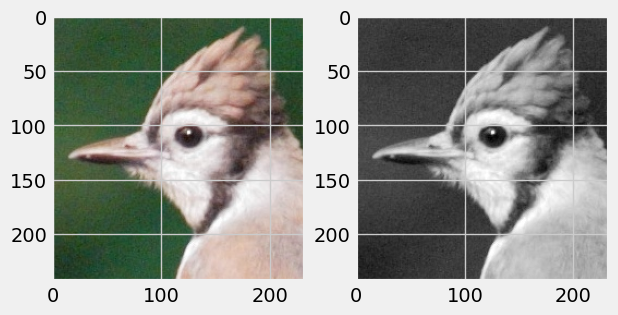

In [212]:
# Load image and conver to float representation
raw_img = cv2.imread("../dataset/sample_image.jpg")
raw_gray_img = cv2.cvtColor(raw_img, cv2.COLOR_BGR2GRAY)
img = raw_img.astype(np.float32) / 255.
gray_img = raw_gray_img.astype(np.float32) / 255.
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.subplot(1, 2, 2)
plt.imshow(gray_img, "gray")

In [6]:
!pip install scikit-learn


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 8.6 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.4/39.4 MB 9.8 MB/s eta 0:00:00:00:010:01


### Results on Gray-scale Image

[[0.7622417 ]
 [0.28946126]]


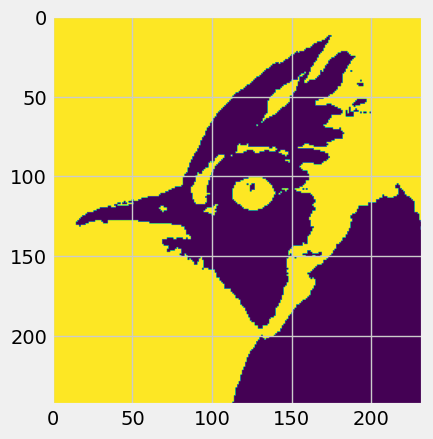

In [215]:
from sklearn.cluster import KMeans
# Flatten the image dimension first
gray_img_flat = gray_img.reshape(-1, 1)
kmeans = KMeans(n_clusters=2, random_state=0).fit(gray_img_flat)

H, W = gray_img.shape
# Unflatten back
labels = kmeans.labels_.reshape(H, W)
plt.imshow(labels)
print(kmeans.cluster_centers_)

[[0.8224684  0.7527647  0.7286166 ]
 [0.23835021 0.3262194  0.22156303]]


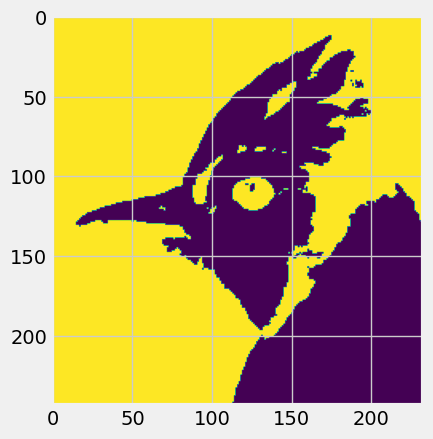

In [214]:
### Results on RGB image
img_flat = img.reshape(-1, 3)
kmeans = KMeans(n_clusters=2, random_state=0).fit(img_flat)

H, W, _ = img.shape
# Unflatten back
labels = kmeans.labels_.reshape(H, W)
plt.imshow(labels)
print(kmeans.cluster_centers_)

### Task 1.2 Implement your own k-means

Now you need to implement your own k-means function. Use your function on different greyscale images and try comparing the results to the results you get from sklearn kmeans function.

### Implement your own functions here:

In [216]:


def my_kmeans(I, k):
    """
    Parameters
    ----------
    I: the image to be segmented (greyscale to begin with) H by W array
    k: the number of clusters (e.g., k=2 for binary segmentation)

    Returns
    ----------
    clusters: a vector that contains the final cluster centres
    L: an array the same size as the input image that contains the label for each of the image pixels, according to which cluster it belongs
    """

    # Ensure the input is a grayscale image
    assert len(I.shape) == 2, "Wrong input dimensions! Please make sure you are using a gray-scale image!"

    # Step 1: Flatten the grayscale image
    H, W = I.shape
    I_flat = I.reshape(-1, 1)  # Flatten to (H*W, 1) for clustering

    # Step 2: Apply K-means clustering
    kmeans = KMeans(n_clusters=k, random_state=0).fit(I_flat)

    # Step 3: Retrieve cluster centers and labels
    clusters = kmeans.cluster_centers_  # Array of cluster centers (k, 1)
    labels = kmeans.labels_             # Labels for each pixel (H*W,)

    # Step 4: Reshape the labels back to the image size
    L = labels.reshape(H, W)  # Reshape to (H, W)

    return clusters, L


def my_kmeans_rgb(I, k):
    """
    Parameters
    ----------
    I: the image to be segmented (RGB) H by W by 3 array
    k: the number of clusters (e.g., k=2 for binary segmentation)

    Returns
    ----------
    clusters: a vector that contains the final cluster centres
    L: an array the same size as the input image that contains the label for each of the image pixels, according to which cluster it belongs
    """

    # Ensure the input is an RGB image
    assert len(I.shape) == 3, "Wrong input dimensions! Please make sure you are using an RGB image!"

    # Step 1: Flatten the RGB image
    H, W, C = I.shape
    I_flat = I.reshape(-1, 3)  # Flatten to (H*W, 3) for clustering

    # Step 2: Apply K-means clustering
    kmeans = KMeans(n_clusters=k, random_state=0).fit(I_flat)

    # Step 3: Retrieve cluster centers and labels
    clusters = kmeans.cluster_centers_  # Array of cluster centers (k, 3)
    labels = kmeans.labels_             # Labels for each pixel (H*W,)

    # Step 4: Reshape the labels back to the image size
    L = labels.reshape(H, W)  # Reshape to (H, W)

    return clusters, L



### Show results here:

[[0.7622417 ]
 [0.28946126]]


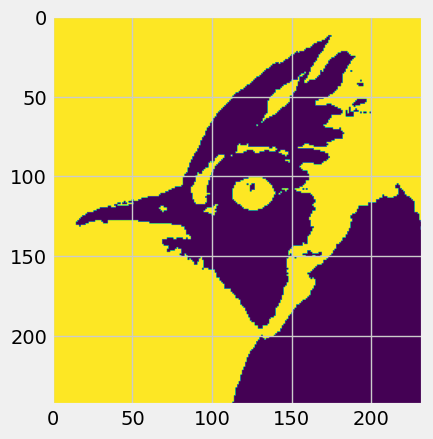

In [217]:
centroids, labels = my_kmeans(gray_img, 2)
print(centroids)
plt.imshow(labels)

### More things to try out:
1. Try different values for k. For k > 2 you will need some way to display the output L (other than simple black and white). Consider using a colour map with the imshow function.
2. Adapt your function so that it will handle colour dataset as well. What changes do you have to make?

[[0.6494615 ]
 [0.28190434]
 [0.839894  ]]


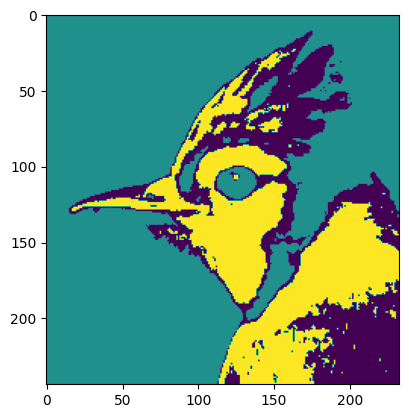

In [78]:
# k=3
centroids, labels = my_kmeans(gray_img, 3)
plt.imshow(labels)
print(centroids)

[[0.8224684  0.7527647  0.7286166 ]
 [0.23835021 0.3262194  0.22156303]]


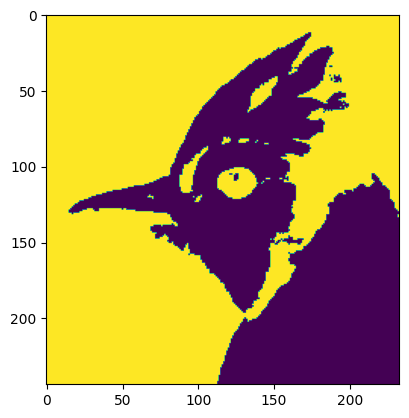

In [79]:
centroids, labels = my_kmeans_rgb(img, 2)
plt.imshow(labels)
print(centroids)

In [80]:
# to visualize the plots within the notebook
%matplotlib inline
# to enable interactive
#%matplotlib ipympl
import matplotlib.image as mpimg
from matplotlib import pyplot as plt
import random
from PIL import Image

## Task 2: Region growing
Region growing is a simple way to segment a region of interest from the background of an image.
It takes in a gray-scale image and produces a binary image as output, where a value of 1 represents the region of interest and a value of 0 represents the background.

The algorithm is:
1. Start from a seed pixel.
2. Add neighbouring pixels that satisfy the criteria defining a region (e.g. similar intensity values, intensity above a threshold).
3. Repeat until we can include no more pixels.

Your task is to write a function in Python that implements the region growing algorithm.
Something like:
```
  segmented_img = region_growing(img, x, y)
```

* img: the image to be segmented
* x: the x-coordinate (j if indexed by numpy array) of the seed pixel
* y: the y-coordinate (i if indexed by numpy array) of the seed pixel
* segmented_img: the binary image output of region growing

**Hint:** This is process basically a **Breadth-first Search (BFS)**, which could be easily implemented it with a **queue** (check out collections.deque in PyThon): 

1. Initialise the queue with the seed pixel. 
2. Every time pop the first element from the queue and add its neighbour pixels to the queue if they satisfy the criteria (e.g. intensity above the threshold).
3. Finish when the queue is empty

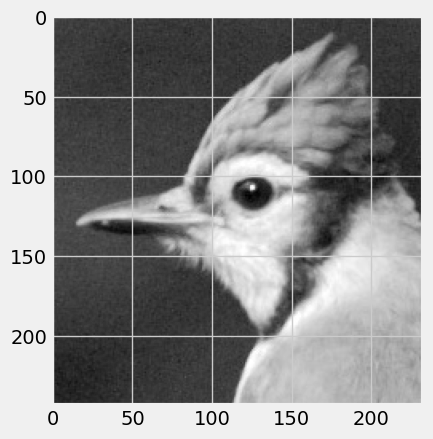

In [220]:
# Load your image
img = cv2.imread('../dataset/sample_image.jpg')
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32)
plt.imshow(gray_img, 'gray')
plt.show()

In [221]:
from collections import deque

    
def region_growing(img, x, y, thresh=80, connectedness=4):
    """
    Implement region growing algorithm to segment a gray scaled image into regions
    :param img: gray scaled image [H, W]
    :param x, y: coordinate of the seed pixel
    :param thresh: region growing threshold
    :param connectedness: 4 or 8 connectivity for neighboring pixels
    :return: segmented image [H, W] as binary
    """
    assert img.ndim == 2, "Expect a gray-scale image!!!"
    assert connectedness in [4, 8], "Connectedness should be 4 or 8"
    
    # Get the dimensions of the image
    height, width = img.shape
    
    # Initialize the segmented binary image
    segmented_img = np.zeros_like(img, dtype=np.uint8)
    
    # Define the connectivity for 4 or 8 connected neighbors
    if connectedness == 4:
        neighbors = [(-1, 0), (1, 0), (0, -1), (0, 1)]
    else:  # 8 connected neighbors
        neighbors = [(-1, 0), (1, 0), (0, -1), (0, 1), (-1, -1), (-1, 1), (1, -1), (1, 1)]
    
    # Initialize the queue with the seed pixel
    queue = deque([(x, y)])
    
    # Get the intensity of the seed pixel
    seed_intensity = img[y, x]
    
    # Mark the seed pixel in the segmented image
    segmented_img[y, x] = 1
    
    # Perform BFS
    while queue:
        cx, cy = queue.popleft()
        
        for dx, dy in neighbors:
            nx, ny = cx + dx, cy + dy
            
            # Check if the neighbor is within the image bounds
            if 0 <= nx < width and 0 <= ny < height:
                # Check if the neighbor satisfies the region growing criteria
                if (segmented_img[ny, nx] == 0 and 
                    abs(int(img[ny, nx]) - int(seed_intensity)) <= thresh):
                    # Add the neighbor to the queue
                    queue.append((nx, ny))
                    # Mark it as part of the segmented region
                    segmented_img[ny, nx] = 1
    
    return segmented_img
    

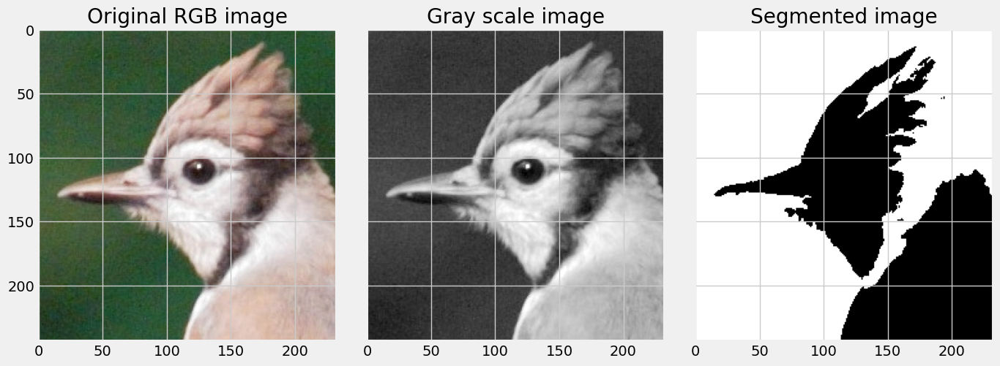

In [222]:
# define set of seed pixel points
x, y = 100, 100

# run region growing algorithm
seg_img = region_growing(gray_img, x, y, thresh=80, connectedness=4)  #thresh=80 change thresh 

# Show Original and segmented image
fig, axis = plt.subplots(1, 3, figsize=(15,10), sharey=True)
fig.subplots_adjust(wspace=0.1, hspace=0.05)
axis[0].imshow(img)
axis[0].set_title('Original RGB image')

axis[1].imshow(gray_img, 'gray')
axis[1].set_title('Gray scale image')

axis[2].imshow(seg_img, 'gray')
axis[2].set_title('Segmented image')
plt.show()

### There are two important factors that influence the performance of a region growing algorithm.

#### 1. The first is the seed pixel selection.
Try the following:
1. Pick a random pixel in the image.
2. Plot the histogram of the image, select a reasonable threshold and then search for a pixel whose intensity value is above the threshold (look for the `matplotlib.pyplot.hist()` function).
3. Do it manually (Hint: You can do this by enabling the interactive mode for `matplotlib`).

Which one is better?

(array([[  0.,  51., 181., ...,   0.,   0.,   0.],
        [  1.,  44., 187., ...,   0.,   0.,   0.],
        [  0.,  46., 183., ...,   0.,   0.,   0.],
        ...,
        [  0.,  74.,  50., ...,  56.,   0.,   0.],
        [  0.,  74.,  53., ...,  41.,   0.,   0.],
        [  0.,  86.,  43., ...,  38.,   0.,   0.]]),
 array([ 16.        ,  39.90000153,  63.79999924,  87.69999695,
        111.59999847, 135.5       , 159.3999939 , 183.30000305,
        207.19999695, 231.09999084, 255.        ]),
 <a list of 233 BarContainer objects>)

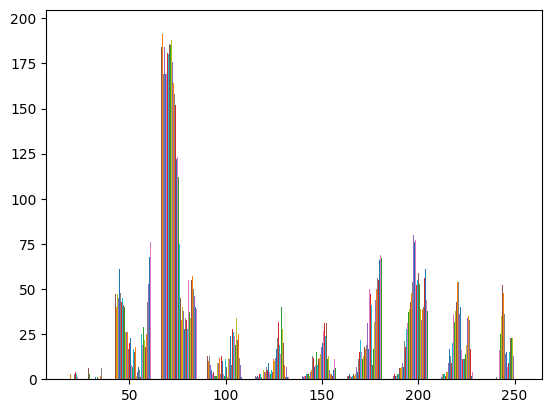

In [29]:
plt.hist(gray_img)

原理：使用直方图分析图像并选择种子像素
在区域生长算法中，选择一个合适的种子像素对分割的结果影响很大。通过绘制图像的直方图，可以直观地分析图像中像素强度的分布，从而选择一个合适的阈值来自动寻找种子像素。

应用原理
1. 图像强度分布的分析
通过直方图，可以清楚看到图像中像素强度的分布。以下情况说明如何选择阈值：

单峰分布: 如果直方图中有一个主峰，说明图像主要由背景组成，目标区域可能是噪声或小区域。这时，可以选择一个较高的固定阈值。

双峰分布: 如果直方图中有两个明显的峰，一个对应背景，另一个对应目标区域，可以选择两个峰之间的谷值作为阈值。这种情况适用于二值化分割的场景。

2. 区域生长的种子选取
选取一个像素强度高于阈值的像素作为种子，是因为目标区域通常比背景区域亮（灰度值高），而低于阈值的像素大概率属于背景。这样可以提高算法的准确性。

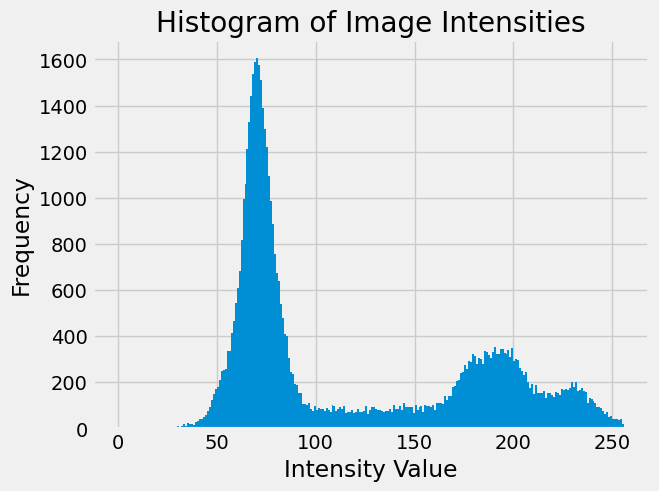

Selected seed pixel: (168, 16)


In [223]:
# 绘制直方图
plt.hist(gray_img.ravel(), bins=256, range=(0, 256))
plt.title("Histogram of Image Intensities")
plt.xlabel("Intensity Value")
plt.ylabel("Frequency")
plt.show()

# 选择一个阈值
threshold = 160

# 找到大于阈值的第一个像素
y, x = np.where(gray_img > threshold)
if len(x) > 0:
    seed_x, seed_y = x[0], y[0]  # 第一个满足条件的像素
    print(f"Selected seed pixel: ({seed_x}, {seed_y})")
else:
    print("No pixel found above the threshold.")

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
# Turn on interactive mode

matplotlib.use('Agg')
# pick three points
%matplotlib tk  
plt.imshow(gray_img, 'gray')
x = plt.ginput(3) 
print(x)


%matplotlib inline 
#  go back to inline plot

#### 2. The second important factor is how to decide whether to add a neighbouring pixel to the existing region. 

Again, there are different options. Try the following alternatives:

1. Compare the pixel intensity value of the neighbours to a specified threshold (try the pixel intensity value of the initial seed pixel). If it is larger, then add it to the region. Depending on the seed pixel you might consider adding pixels with smaller intensities or even using a range of valid intensity values.
    
2. Compare the pixel intensity value of the neighbours to the average pixel intensity value of the existing region. The neighbour with the smallest difference to the average is added to the region. How will we stop adding neighbours to the region in this case?

Which one is better?

In [15]:
# Write your own code here
# Region growing using average intensity comparison
def region_growing_avg(img, x, y, dist_thresh=50, connectedness=4):
    height, width = img.shape
    segmented_img = np.zeros_like(img, dtype=np.uint8)
    queue = deque([(x, y)])
    segmented_img[y, x] = 1
    region_pixels = [(x, y)]  # Track pixels in the region for averaging
    
    if connectedness == 4:
        neighbors = [(-1, 0), (1, 0), (0, -1), (0, 1)]
    else:
        neighbors = [(-1, 0), (1, 0), (0, -1), (0, 1), (-1, -1), (-1, 1), (1, -1), (1, 1)]
    
    while queue:
        cx, cy = queue.popleft()
        region_avg = np.mean([img[py, px] for px, py in region_pixels])  # Calculate average intensity
        
        for dx, dy in neighbors:
            nx, ny = cx + dx, cy + dy
            if 0 <= nx < width and 0 <= ny < height:
                if segmented_img[ny, nx] == 0 and abs(int(img[ny, nx]) - int(region_avg)) <= dist_thresh:
                    queue.append((nx, ny))
                    segmented_img[ny, nx] = 1
                    region_pixels.append((nx, ny))  # Add to region pixel list
    return segmented_img

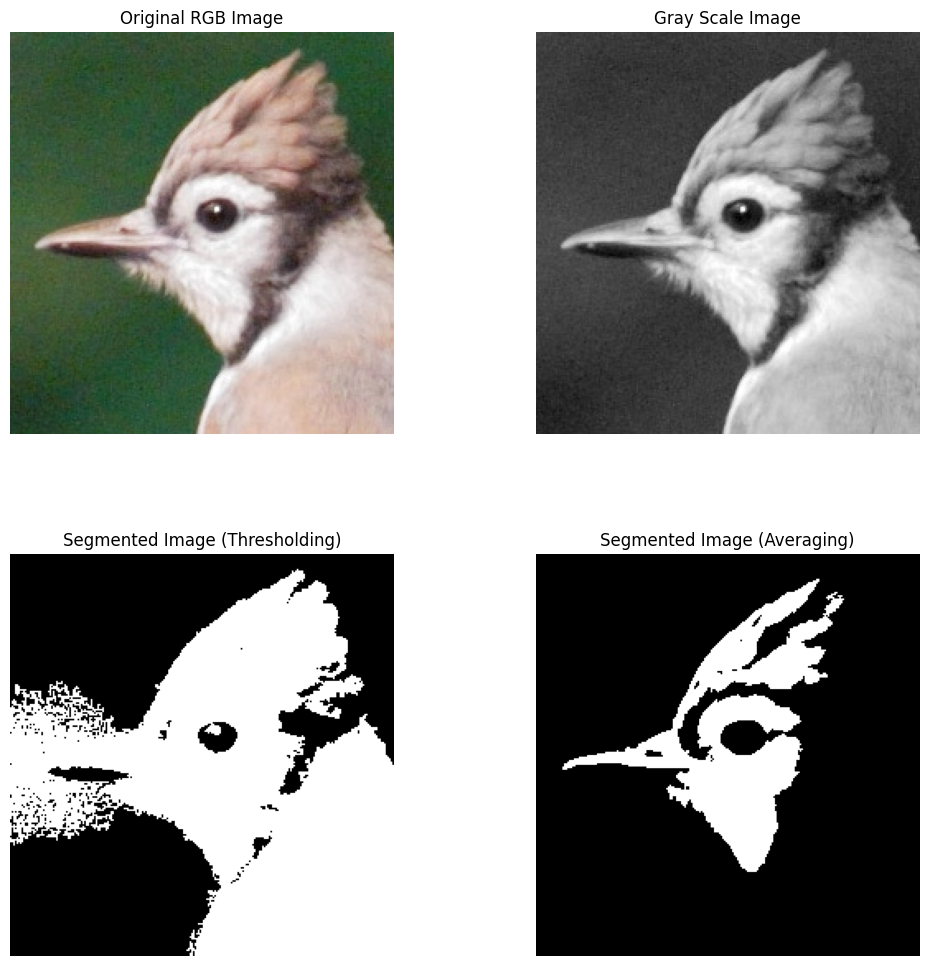

In [16]:
# define set of seed pixel points
x, y = 100, 100

# run region growing algorithm
seg_img = region_growing(gray_img, x, y, thresh=100, connectedness=4)
seg_img2 = region_growing_avg(gray_img, x, y, dist_thresh=50, connectedness=4)

# Show Original and segmented image in a 2x2 grid layout
fig, axis = plt.subplots(2, 2, figsize=(12, 12))
fig.subplots_adjust(wspace=0.3, hspace=0.3)

# First row
axis[0, 0].imshow(img)
axis[0, 0].set_title('Original RGB Image')

axis[0, 1].imshow(gray_img, cmap='gray')
axis[0, 1].set_title('Gray Scale Image')

# Second row
axis[1, 0].imshow(seg_img, cmap='gray')
axis[1, 0].set_title('Segmented Image (Thresholding)')

axis[1, 1].imshow(seg_img2, cmap='gray')
axis[1, 1].set_title('Segmented Image (Averaging)')

# Remove axis labels for a cleaner look
for ax in axis.flat:
    ax.axis('off')

plt.show()


### More things to try out:
1. What kind of connectivity did you use for considering neighbour pixels? If you used 4- connectivity, try 8-connectivity, if you used 8-connectivity then try 4-connectivity.
    Does this change results?
    
2. What if there are multiple regions of interest? Consider using multiple seed points. How will you choose these?

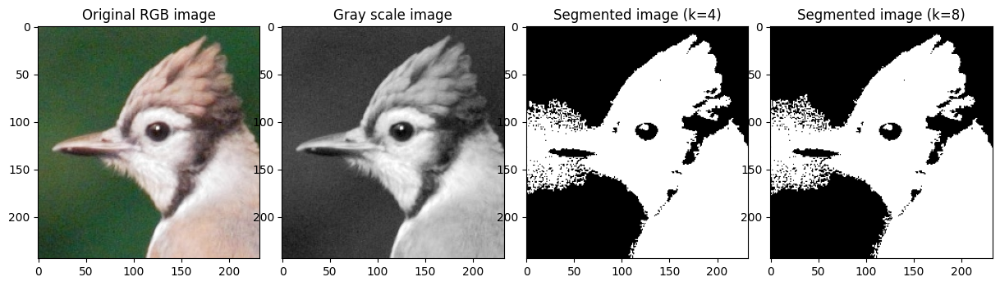

In [17]:
# define set of seed pixel points
x, y = 100, 100

# run region growing algorithm
seg_img = region_growing(gray_img, x, y, thresh=100, connectedness=4)
seg_img2 = region_growing(gray_img, x, y, thresh=100, connectedness=8)

# Show Original and segmented image
fig, axis = plt.subplots(1, 4, figsize=(15,15))
fig.subplots_adjust(wspace=0.1, hspace=0.05)
axis[0].imshow(img)
axis[0].set_title('Original RGB image')

axis[1].imshow(gray_img, 'gray')
axis[1].set_title('Gray scale image')

axis[2].imshow(seg_img, 'gray')
axis[2].set_title('Segmented image (k=4)')

axis[3].imshow(seg_img2, 'gray')
axis[3].set_title('Segmented image (k=8)')
plt.show()

从这里我开始尝试多个种子的选择。（自己加的部分）

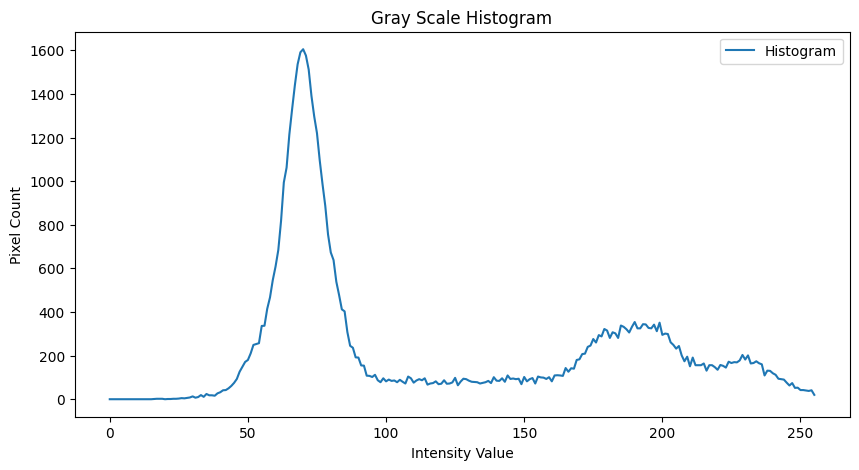

Enter the lower bound of the intensity range: 160
Enter the upper bound of the intensity range: 250
Selected intensity range: 160-250


In [41]:
hist, bins = np.histogram(gray_img.ravel(), bins=256, range=(0, 256))
plt.figure(figsize=(10, 5))
plt.plot(hist, label="Histogram")
plt.title("Gray Scale Histogram")
plt.xlabel("Intensity Value")
plt.ylabel("Pixel Count")
plt.legend()
plt.show()

# 用户输入目标灰度范围
lower_bound = int(input("Enter the lower bound of the intensity range: "))
upper_bound = int(input("Enter the upper bound of the intensity range: "))
print(f"Selected intensity range: {lower_bound}-{upper_bound}")




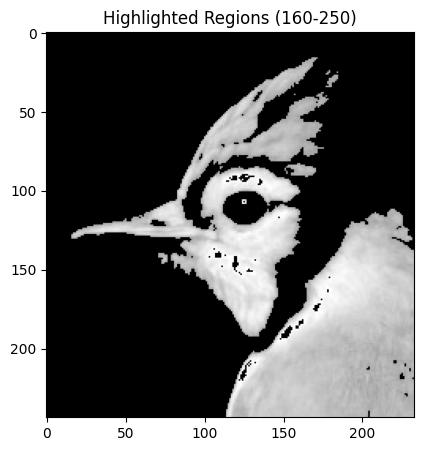

In [42]:
# 创建掩码，突出显示目标区域
mask = (gray_img >= lower_bound) & (gray_img <= upper_bound)
highlighted_img = gray_img.copy()
highlighted_img[~mask] = 0  # 将非目标区域置为黑色

# 显示目标区域
plt.figure(figsize=(10, 5))
plt.imshow(highlighted_img, cmap='gray')
plt.title(f"Highlighted Regions ({lower_bound}-{upper_bound})")
plt.axis('on')
plt.show()


In [35]:
# 切换到交互式绘图后端
%matplotlib tk

# 显示高亮区域，用户手动选择种子点
plt.imshow(highlighted_img, cmap='gray')
plt.title("Click to Select Seed Points (Close when done)")
plt.axis('on')

# 用户点击图像选择种子点
seed_points = plt.ginput(n=5, timeout=30)  # 允许用户选择最多5个种子点
plt.close()

# 转换种子点为整数坐标
seeds = [(int(pt[0]), int(pt[1])) for pt in seed_points]
print(f"Manually selected seed points: {seeds}")


Manually selected seed points: [(109, 100), (195, 152), (126, 142), (159, 195), (208, 220)]


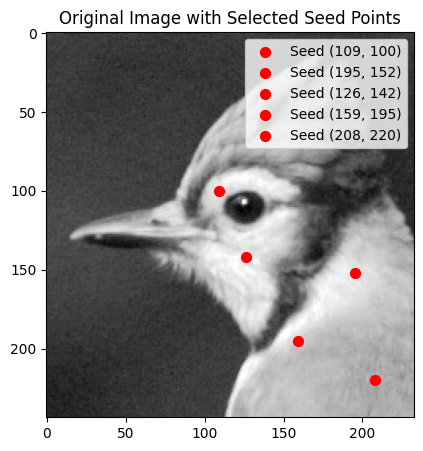

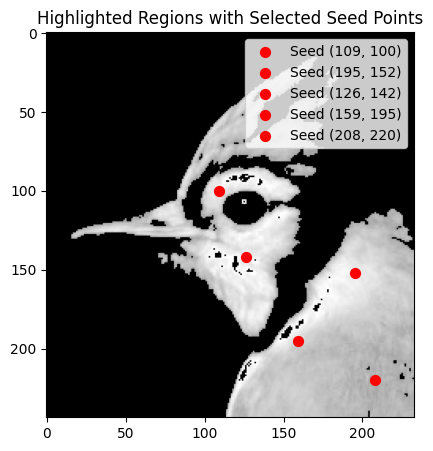

In [43]:
# 在原始图像上标记种子点
plt.figure(figsize=(10, 5))
plt.imshow(gray_img, cmap='gray')
for seed in seeds:
    plt.scatter(seed[0], seed[1], color='red', s=50, label=f"Seed {seed}")
plt.title("Original Image with Selected Seed Points")
plt.legend()
plt.show()

# 在高亮区域中标记种子点
plt.figure(figsize=(10, 5))
plt.imshow(highlighted_img, cmap='gray')
for seed in seeds:
    plt.scatter(seed[0], seed[1], color='red', s=50, label=f"Seed {seed}")
plt.title("Highlighted Regions with Selected Seed Points")
plt.legend()
plt.show()


到这个位置算是把手动找到的seeds完成了，接下来尝试分割
之前是用了Matlab的交互模式，需要退出一下

In [37]:
%matplotlib inline


In [28]:

def region_growing_multi_seeds(img, seeds, thresh=10, connectedness=4):
    """
    Region growing algorithm for multiple seed points.
    :param img: Input grayscale image
    :param seeds: List of seed points [(x1, y1), (x2, y2), ...]
    :param thresh: Threshold for region growing
    :param connectedness: 4 or 8 connectivity for neighbors
    :return: Binary segmented image
    """
    height, width = img.shape
    segmented_img = np.zeros_like(img, dtype=np.uint8)  # Initialize segmented image with zeros

    # Define connectivity
    if connectedness == 4:
        neighbors = [(-1, 0), (1, 0), (0, -1), (0, 1)]
    elif connectedness == 8:
        neighbors = [(-1, 0), (1, 0), (0, -1), (0, 1), (-1, -1), (-1, 1), (1, -1), (1, 1)]
    else:
        raise ValueError("Connectedness must be 4 or 8")
    
    # Initialize queue with all seed points
    queue = deque(seeds)
    
    # Process queue
    while queue:
        cx, cy = queue.popleft()
        
        for dx, dy in neighbors:
            nx, ny = cx + dx, cy + dy
            
            # Check if the pixel is within bounds and not yet processed
            if 0 <= nx < width and 0 <= ny < height and segmented_img[ny, nx] == 0:
                # Check if the intensity difference is within threshold
                if abs(int(img[ny, nx]) - int(img[cy, cx])) <= thresh:
                    queue.append((nx, ny))
                    segmented_img[ny, nx] = 1  # Mark the pixel as part of the segmented region
    
    return segmented_img



Seed (109, 100): Intensity = 231.0
Seed (195, 152): Intensity = 232.0
Seed (126, 142): Intensity = 235.0
Seed (159, 195): Intensity = 215.0
Seed (208, 220): Intensity = 172.0


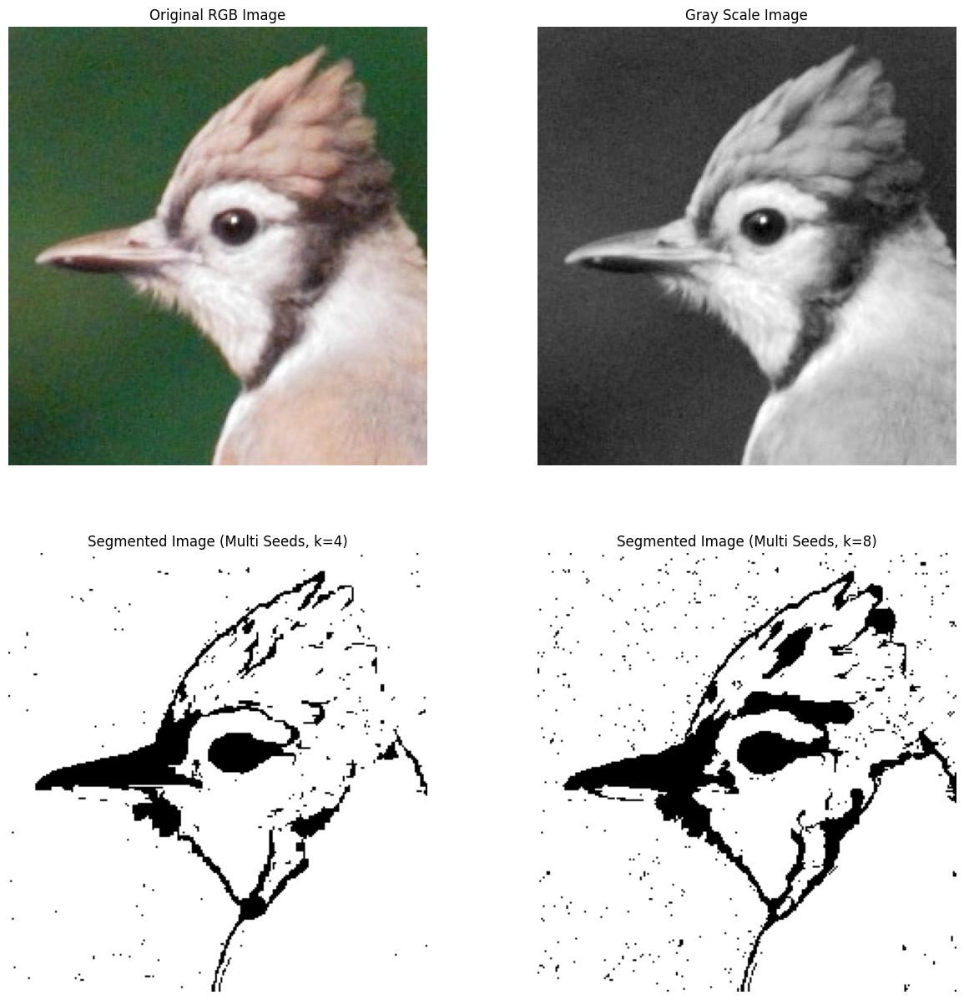

In [47]:


# Define multiple seed points
seeds = [(109, 100), (195, 152), (126, 142), (159, 195), (208, 220)] 

# 打印每个种子点的灰度值
for seed in seeds:
    print(f"Seed {seed}: Intensity = {gray_img[seed[1], seed[0]]}")


# Run region growing with 4-connectivity
seg_img_multi_4 = region_growing_multi_seeds(gray_img, seeds, thresh=8, connectedness=4)

# Run region growing with 8-connectivity
seg_img_multi_8 = region_growing_multi_seeds(gray_img, seeds, thresh=5, connectedness=8)

# Show Original and Segmented Images
fig, axis = plt.subplots(2, 2, figsize=(15, 15))
fig.subplots_adjust(wspace=0.2, hspace=0.2)

axis[0, 0].imshow(img)
axis[0, 0].set_title('Original RGB Image')

axis[0, 1].imshow(gray_img, cmap='gray')
axis[0, 1].set_title('Gray Scale Image')

axis[1, 0].imshow(seg_img_multi_4, cmap='gray')
axis[1, 0].set_title('Segmented Image (Multi Seeds, k=4)')

axis[1, 1].imshow(seg_img_multi_8, cmap='gray')
axis[1, 1].set_title('Segmented Image (Multi Seeds, k=8)')

# Clean up axis
for ax in axis.flat:
    ax.axis('off')

plt.show()



分析原因：
在相同的seeds和thresh下 k=4 连接性分割效果不如 k=8

k=4（四邻域） 更严格，只允许水平和垂直方向上的像素生长。这在目标区域边缘复杂、连通性较高的情况下，可能会导致分割效果不完整。
k=8（八邻域） 更宽松，还允许对角线方向的生长，适合处理复杂边缘或连通区域，因此可能在当前图像上表现更好。
阈值 (thresh) 过高导致图像全白

如果 thresh 设置过高（如 50 或以上），区域生长会过度扩展，将大量背景区域包含进来，导致分割结果几乎全白。
这是因为高阈值允许相邻像素之间的灰度差异非常大，生长区域迅速扩展到目标区域外。

# Run region growing with 4-connectivity
seg_img_multi_4 = region_growing_multi_seeds(gray_img, seeds, thresh=8, connectedness=4)

# Run region growing with 8-connectivity
seg_img_multi_8 = region_growing_multi_seeds(gray_img, seeds, thresh=5, connectedness=8) 这样效果差不多一致



Balance Between Threshold (thresh) and Connectivity (connectedness)
k=4 with a higher threshold (thresh=8) allows more significant intensity differences between neighboring pixels. This compensates for the stricter connectivity rule, where only vertical and horizontal neighbors are considered.

k=8 with a lower threshold (thresh=5) allows fewer intensity differences but uses a more relaxed connectivity rule, including diagonal neighbors.
This balance explains why the results are similar; both configurations compensate for the limitations of the other.

## Task 3: Connected Components 

Connected-component labeling (also known as connected-component analysis, or region labeling) is an algorithmic application of graph theory that is used to determine the connectivity of “blob”-like regions in a binary image.
Specifically, the algorithm labels each connected component of a binary image with a separate number.

Similar to Region Growing, for a single connected-component we can start from a seed and iteratively traverse all the neighbouring pixels. In this case, a Depth-first Serach (DFS) is a better way:

Then we just need to repeat this process for all the connected components in the image.

In [67]:


def colourize(ccl_img):
    cmap = plt.cm.get_cmap("hsv", np.max(ccl_img) + 1)  # HSV colormap
    rgba_img = cmap(ccl_img / np.max(ccl_img))  # Normalize and colorize
    
    # 转换为 RGB 并将背景（标记为 0 的区域）设置为黑色
    rgb_img = (rgba_img[:, :, :3] * 255).astype(np.uint8)
    rgb_img[ccl_img == 0] = [0, 0, 0]  # 背景设为黑色

    return rgb_img



def connected_components_label(img, connectedness=4):
    if connectedness not in [4, 8]:
        raise ValueError("Connectedness must be 4 or 8.")
    
    rows, cols = img.shape  # Get image dimensions
    labels = np.zeros_like(img, dtype=np.int32)  # Initialize label matrix
    current_label = 1  # Start labeling from 1
    
    # Define neighbor offsets for 4-connected or 8-connected
    if connectedness == 4:
        neighbors = [(-1, 0), (1, 0), (0, -1), (0, 1)]
    elif connectedness == 8:
        neighbors = [(-1, -1), (-1, 0), (-1, 1), (0, -1), (0, 1), (1, -1), (1, 0), (1, 1)]
    
    def dfs(r, c):
        stack = [(r, c)]
        labels[r, c] = current_label
        while stack:
            x, y = stack.pop()
            for dx, dy in neighbors:
                nx, ny = x + dx, y + dy
                if 0 <= nx < rows and 0 <= ny < cols and img[nx, ny] == 1 and labels[nx, ny] == 0:
                    labels[nx, ny] = current_label
                    stack.append((nx, ny))
    
    # Main loop to find and label components
    for r in range(rows):
        for c in range(cols):
            if img[r, c] == 1 and labels[r, c] == 0:
                dfs(r, c)
                current_label += 1
    
    return labels

/var/folders/fz/zr6763rs13vfc1p314r_4g180000gn/T/ipykernel_34680/3156092346.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("hsv", np.max(ccl_img) + 1)  # HSV colormap


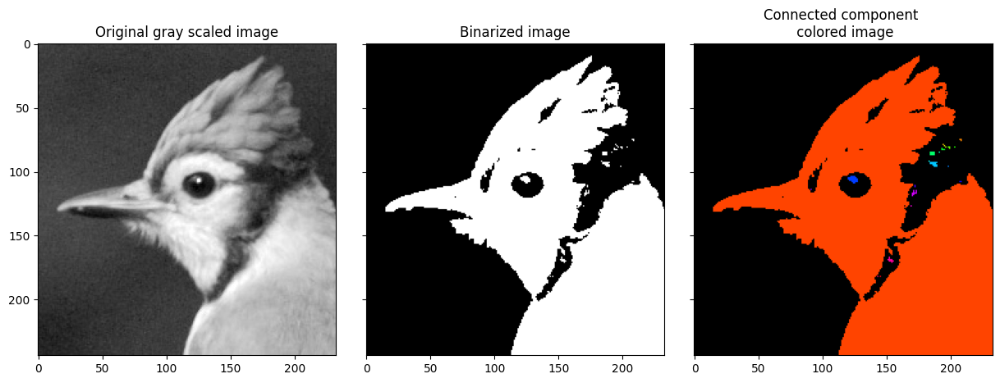

Number of connected components: 22


In [68]:


bimg = (gray_img > 100).astype(np.float32)
ccl_img = connected_components_label(bimg)

fig, axis = plt.subplots(1, 3, figsize=(15,10), sharey=True)
fig.subplots_adjust(wspace=0.1, hspace=0.05)
axis[0].imshow(gray_img, 'gray')
axis[0].set_title('Original gray scaled image')

axis[1].imshow(bimg, 'gray')
axis[1].set_title('Binarized image')

axis[2].imshow(colourize(ccl_img))
axis[2].set_title('Connected component \n colored image')
plt.show()


unique_labels = np.unique(ccl_img)
print(f"Number of connected components: {len(unique_labels) - 1}")  # -1 是因为 0 表示背景




The previous image was not a very good example to showcase the connected component algorithm. Next, you will see a better image.

/var/folders/fz/zr6763rs13vfc1p314r_4g180000gn/T/ipykernel_34680/3156092346.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("hsv", np.max(ccl_img) + 1)  # HSV colormap


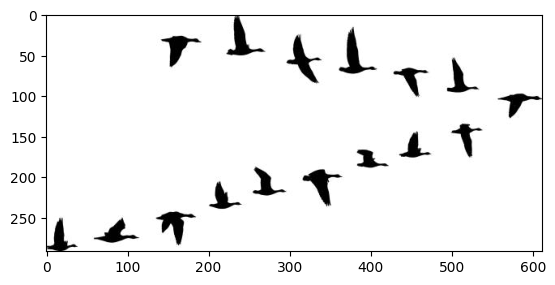

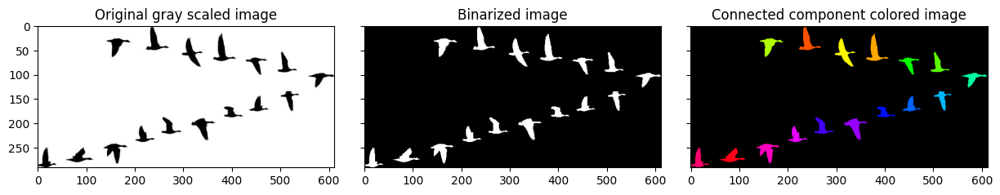

In [69]:
img2 = cv2.imread("../dataset/gooses.jpg")
gray_img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY).astype(np.float32)
plt.imshow(gray_img2, 'gray')

bimg2 = (gray_img2 < 100).astype(np.float32)
ccl_img2 = connected_components_label(bimg2)

fig, axis = plt.subplots(1, 3, figsize=(15,10), sharey=True)
fig.subplots_adjust(wspace=0.1, hspace=0.05)
axis[0].imshow(gray_img2, 'gray')
axis[0].set_title('Original gray scaled image')

axis[1].imshow(bimg2, 'gray')
axis[1].set_title('Binarized image')

axis[2].imshow(colourize(ccl_img2))
axis[2].set_title('Connected component colored image')
plt.show()

### Tasks
Your task is to count the number of candies in the image below (Candy1):
1. Show your code and intermediate results for each step
2. Explain how the parameters were selected and what prior information you use.
3. Report your answer
4. Try your code on Candy2 without anychanges and report reuslt, discuss how would you improve the method for them.

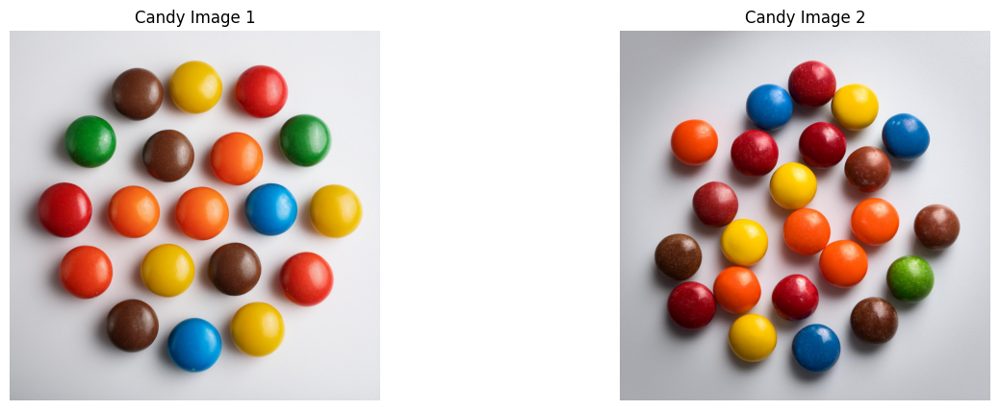

In [71]:
# Read first candy image
img1 = cv2.imread('../dataset/candy1.jpeg')
# Convert BGR to RGB for correct color display
img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

# Read second candy image
img2 = cv2.imread('../dataset/candy2.jpeg')
# Convert BGR to RGB for correct color display
img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

# Create figure with two subplots side by side
plt.figure(figsize=(15, 5))

# Display first image
plt.subplot(1, 2, 1)
plt.imshow(img1_rgb)
plt.title('Candy Image 1')
plt.axis('off')

# Display second image
plt.subplot(1, 2, 2)
plt.imshow(img2_rgb)
plt.title('Candy Image 2')
plt.axis('off')

plt.show()

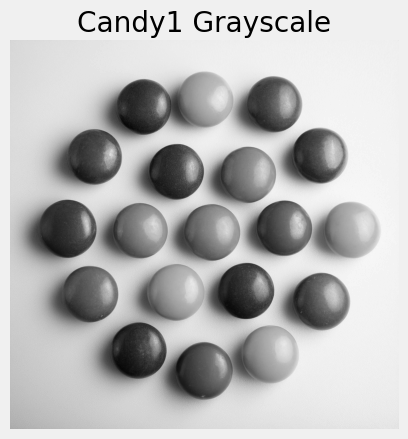

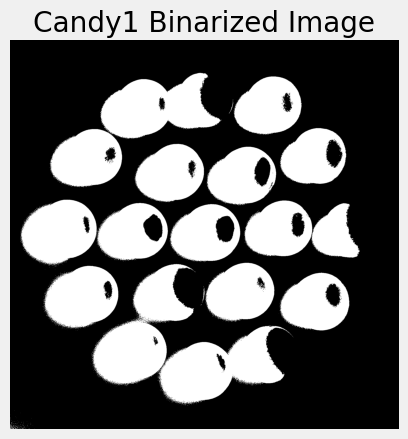

In [195]:
# 读取 Candy1 图像
img1 = cv2.imread('../dataset/candy1.jpeg')
gray_img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

# 显示灰度图像
plt.imshow(gray_img1, cmap='gray')
plt.title("Candy1 Grayscale")
plt.axis('off')
plt.show()


img_binary = (gray_img1 < 127).astype(np.float32)

# 显示二值化结果
plt.imshow(bimg1, cmap='gray')
plt.title("Candy1 Binarized Image")
plt.axis('off')
plt.show()

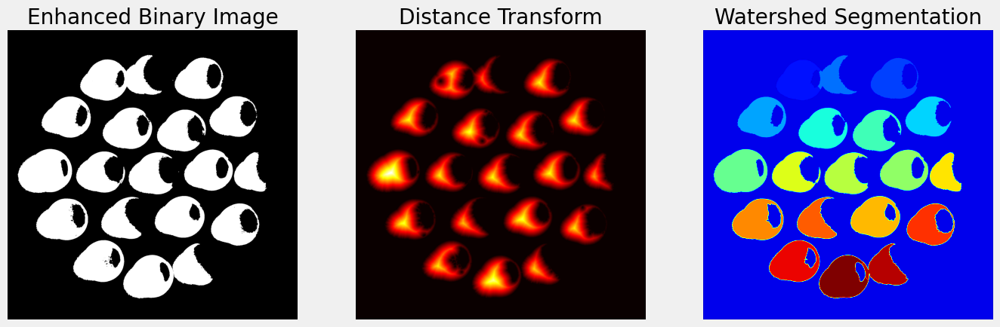

Corrected Candy Count: 19


In [206]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 改进的分水岭算法代码
def enhanced_watershed_segmentation(img):
    """
    Perform watershed segmentation with improved preprocessing steps.
    """
    # Step 1: 直方图均衡化 (增强对比度)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    img_enhanced = clahe.apply(img)
    
    # Step 2: 二值化 (Binary Threshold)
    _, binary_image = cv2.threshold(img_enhanced, 127, 255, cv2.THRESH_BINARY_INV)
    
    # Step 3: 形态学操作 (Morphological Opening)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    binary_image = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel)
    
    # Step 4: 距离变换 (Distance Transform)
    dist_transform = cv2.distanceTransform(binary_image, cv2.DIST_L2, 5)
    _, sure_fg = cv2.threshold(dist_transform, 0.5 * dist_transform.max(), 255, 0)
    sure_fg = np.uint8(sure_fg)
    
    # Step 5: 背景区域 (Background Region)
    sure_bg = cv2.dilate(binary_image, kernel, iterations=3)
    unknown = cv2.subtract(sure_bg, sure_fg)
    
    # Step 6: 标记连通区域 (Connected Components)
    _, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1  # 确保背景标记为 1
    markers[unknown == 255] = 0
    
    # Step 7: 应用分水岭算法 (Apply Watershed)
    markers = cv2.watershed(cv2.cvtColor(binary_image, cv2.COLOR_GRAY2BGR), markers)
    
    return binary_image, dist_transform, markers

# 加载图像
candy1_path = '../dataset/candy1.jpeg'
img = cv2.imread(candy1_path, cv2.IMREAD_GRAYSCALE)

# 应用改进的分水岭算法
binary_image, dist_transform, markers = enhanced_watershed_segmentation(img)

# 可视化结果
plt.figure(figsize=(15, 5))

# 显示增强对比后的二值化图像
plt.subplot(1, 3, 1)
plt.imshow(binary_image, cmap='gray')
plt.title('Enhanced Binary Image')
plt.axis('off')

# 显示距离变换结果
plt.subplot(1, 3, 2)
plt.imshow(dist_transform, cmap='hot')
plt.title('Distance Transform')
plt.axis('off')

# 显示分水岭标记图像
plt.subplot(1, 3, 3)
plt.imshow(markers, cmap='jet')
plt.title('Watershed Segmentation')
plt.axis('off')

plt.show()

# 计算糖果数量
unique_labels = np.unique(markers)
valid_candies = len(unique_labels[unique_labels > 1])  # 去掉背景和边界
print(f"Corrected Candy Count: {valid_candies}")


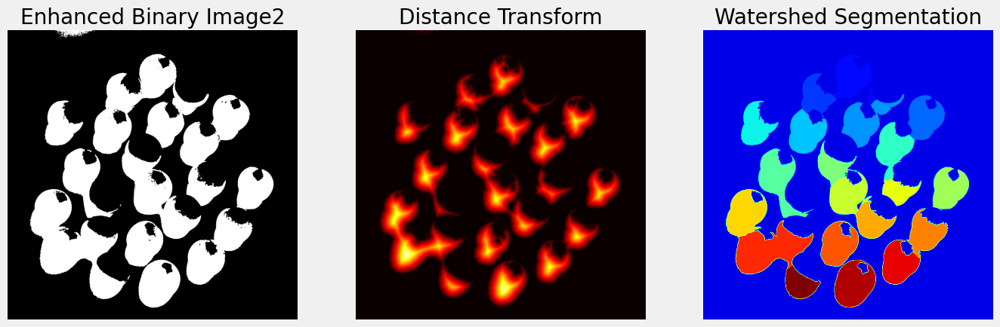

Corrected Candy Count: 20


In [196]:
# Read second candy image
candy1_path = '../dataset/candy2.jpeg'
img2 = cv2.imread(candy1_path, cv2.IMREAD_GRAYSCALE)

# 应用改进的分水岭算法
binary_image, dist_transform, markers = enhanced_watershed_segmentation(img2)

# 可视化结果
plt.figure(figsize=(15, 5))

# 显示增强对比后的二值化图像
plt.subplot(1, 3, 1)
plt.imshow(binary_image, cmap='gray')
plt.title('Enhanced Binary Image')
plt.axis('off')

# 显示距离变换结果
plt.subplot(1, 3, 2)
plt.imshow(dist_transform, cmap='hot')
plt.title('Distance Transform')
plt.axis('off')

# 显示分水岭标记图像
plt.subplot(1, 3, 3)
plt.imshow(markers, cmap='jet')
plt.title('Watershed Segmentation')
plt.axis('off')

plt.show()

# 计算糖果数量
unique_labels = np.unique(markers)
valid_candies = len(unique_labels[unique_labels > 1])  # 去掉背景和边界
print(f"Corrected Candy Count: {valid_candies}")


In [96]:
# Perform connected-component analysis
num_labels1, labels_img1 = cv2.connectedComponents(img1_binary)
num_labels2, labels_img2 = cv2.connectedComponents(img2_binary)

# Display labeled images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(labels_img1, cmap='jet')
plt.title(f'Candy Image 1 - {num_labels1 - 1} Candies')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(labels_img2, cmap='jet')
plt.title(f'Candy Image 2 - {num_labels2 - 1} Candies')
plt.axis('off')

plt.show()


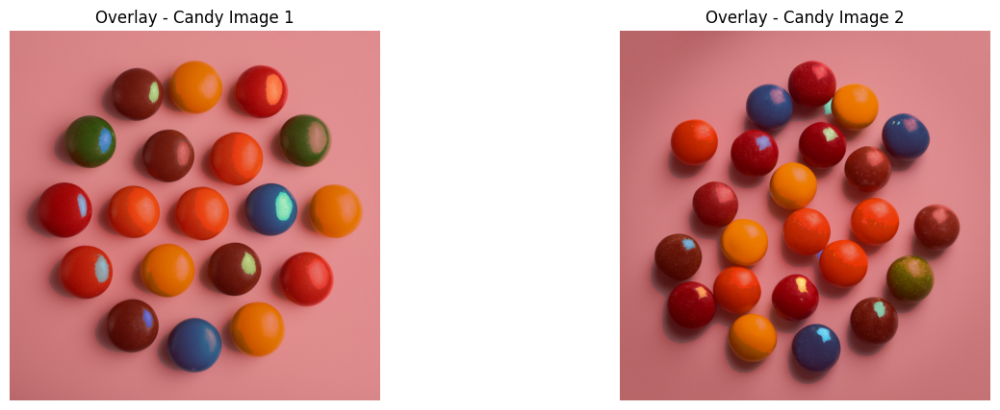

In [93]:
# Create a color map overlay
labels_img1_color = cv2.applyColorMap((labels_img1 * 20).astype('uint8'), cv2.COLORMAP_JET)
labels_img2_color = cv2.applyColorMap((labels_img2 * 20).astype('uint8'), cv2.COLORMAP_JET)

# Overlay on original
overlay1 = cv2.addWeighted(img1_rgb, 0.6, labels_img1_color, 0.4, 0)
overlay2 = cv2.addWeighted(img2_rgb, 0.6, labels_img2_color, 0.4, 0)

# Display overlay results
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.imshow(overlay1)
plt.title('Overlay - Candy Image 1')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(overlay2)
plt.title('Overlay - Candy Image 2')
plt.axis('off')

plt.show()


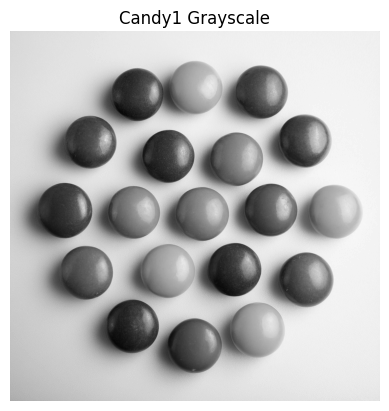

In [78]:
# 读取 Candy1 图像
img1 = cv2.imread('../dataset/candy1.jpeg')
gray_img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

# 显示灰度图像
plt.imshow(gray_img1, cmap='gray')
plt.title("Candy1 Grayscale")
plt.axis('off')
plt.show()


# Part 2: Filter
In the last lecture you learned about linear image filtering operations like correlation and
convolution and how these can be applied directly on the image.
These kind of filtering operations have many uses, ranging from smoothing and noise
reduction, to feature enhancement and sharpening, calculating image derivatives, edge
detection and even template matching.
Your task today is to code your own linear filtering functions operating on the image domain.

In [ ]:
import numpy as np
import cv2
import matplotlib.image as mpimg
from matplotlib import pyplot as plt
# to visualize the plots within the notebook
%matplotlib inline

## Task 4 Convolution
Convolution is a fundamental operation for applying linear filters to images. It takes as input
an image (greyscale) I and a filter kernel K and returns the result I’ of convolving the image
with this filter.

Definition: Given a greyscale image I and a filter K of size (2N + 1) x (2M + 1) (we use odd
dimension filters like 3 x 3, 5 x 5 etc.), convolution is defined as:

\begin{equation}
I'(x, y) = \sum_{i=-a}^a \sum_{j=-b}^b K(i, j) I(x - i, y - j)
\end{equation}

Your task is to write your own convolution function (do not use the conv2() function) and test
it with different filters. How will you handle the behaviour of the filter in the edges of the
image (pad with zeros, copy the edge etc.)?

Smoothing filters that reduce noise in images are quite useful in image processing. Use a
simple mean filter like:

\begin{equation}
\begin{bmatrix}1 & 1 & 1\\1 & 1 & 1\\1 & 1 & 1\end{bmatrix}
\end{equation}

This filter replaces each pixel by the average of its neighbourhood. Now if we want
something better, we can try weighing the contributions of the neighbouring pixels by their
proximity to the centre pixel. Try a Gaussian filter, which is defined as: 

\begin{equation}
G_{\sigma} = \frac{1}{2\pi \sigma^2} e^{-\frac{(x^2 + y^2)}{2 \sigma^2}}
\end{equation}

where $\sigma$ is the standard deviationof the Gaussian. This is a continuous function, so your filter will need to sample it in both x and y directions (use np.meshgrid()), keeping in mind the value for $\sigma$ that you chose. Try different filter sizes and different values for $\sigma$ and compare the results. Here is the results obtained using opencv built-in functions. If your implementation is correct, you should expect to have similar results.

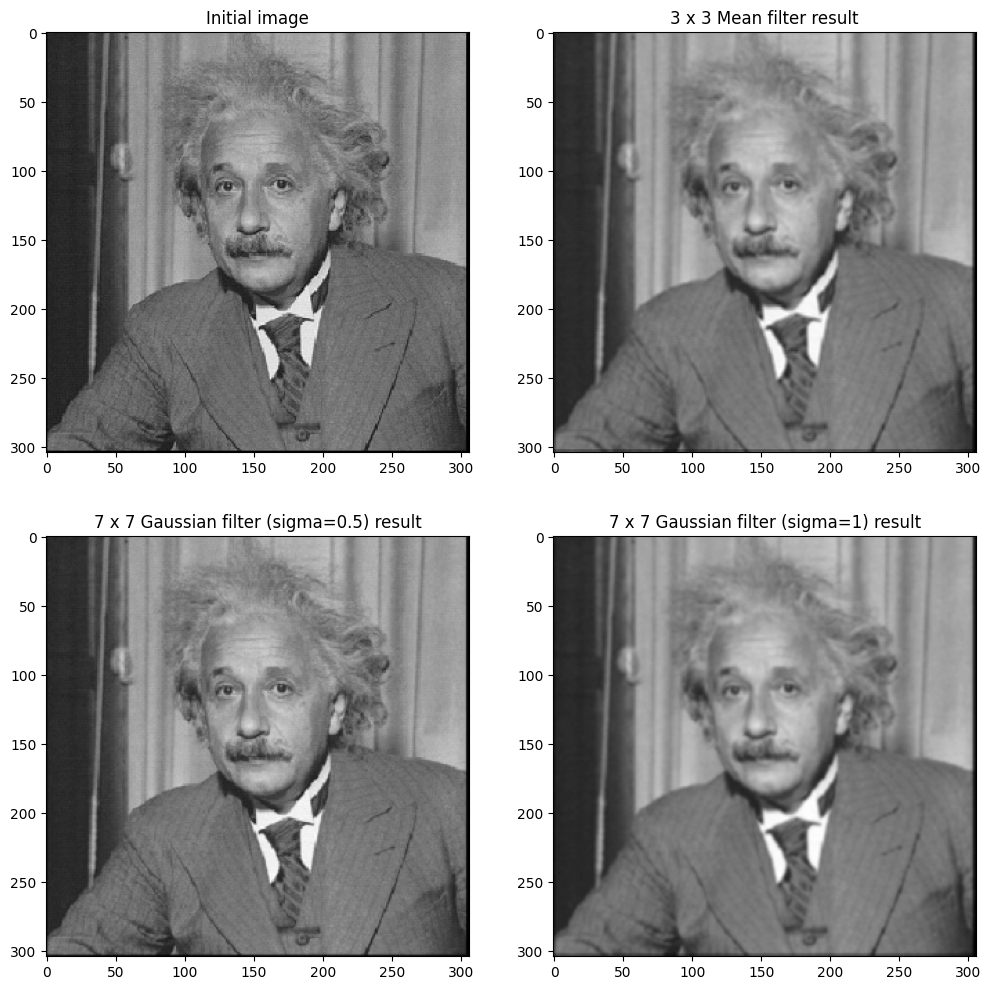

In [144]:
img = cv2.imread("../dataset/einstein.png")
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32)
mean_blur = cv2.blur(img_gray, (3, 3))  # mean filter 3x3
gaussian_1 = cv2.GaussianBlur(img_gray, (7, 7), 0.5, 0.5)  # gaussian filter 7x7, sigma = 0.5
gaussian_2 = cv2.GaussianBlur(img_gray, (7, 7), 1., 1.)  # gaussian filter 7x7, sigma = 1.0
fig = plt.figure(figsize=(12, 12))
ax1 = plt.subplot(2, 2, 1)
ax1.title.set_text("Initial image")
plt.imshow(img_gray, "gray")
ax2 = plt.subplot(2, 2, 2)
ax2.title.set_text("3 x 3 Mean filter result")
plt.imshow(mean_blur, "gray")
ax3 = plt.subplot(2, 2, 3)
ax3.title.set_text("7 x 7 Gaussian filter (sigma=0.5) result")
plt.imshow(gaussian_1, "gray")
ax4 = plt.subplot(2, 2, 4)
ax4.title.set_text("7 x 7 Gaussian filter (sigma=1) result")
plt.imshow(gaussian_2, "gray")
plt.show()

### Implement your own code here:

hint: You can use `cv2.copyMakeBorder` to do paddings to the image. Figure out how to use it by yourself!

In [166]:
def apply_filter(src_img, kernel, padding_type='zero'):
    """
    Apply filtering algorithm on a gray-scale image with the given kernel.
    :param src_img: gray scaled source image with size HxW
    :param kernel: kernel to be applied to the source image
    :param padding_type: how to handle edges ('zero', 'replicate')
    :return rst_img: filtered image
    """
    assert len(src_img.shape) == 2, "Dimension mismatch! Please supply gray-scale image only!"
    assert len(kernel.shape) == 2, "Dimension mismatch! Please supply 2D kernel only!"

    H, W = src_img.shape
    kH, kW = kernel.shape
    pad_h, pad_w = kH // 2, kW // 2

    # Apply padding
    if padding_type == 'zero':
        padded_img = cv2.copyMakeBorder(src_img, pad_h, pad_h, pad_w, pad_w, cv2.BORDER_CONSTANT, value=0)
    elif padding_type == 'replicate':
        padded_img = cv2.copyMakeBorder(src_img, pad_h, pad_h, pad_w, pad_w, cv2.BORDER_REPLICATE)
    else:
        raise ValueError("Invalid padding type. Choose 'zero' or 'replicate'.")

    # Convolution operation
    filtered_img = np.zeros_like(src_img, dtype=np.float32)
    for i in range(H):
        for j in range(W):
            region = padded_img[i:i+kH, j:j+kW]
            filtered_img[i, j] = np.sum(region * kernel)

    return filtered_img



    
def get_mean_filter_kernel(h, w):
    '''
    Get kernel of mean filter
    '''
    return np.ones((h, w), dtype=np.float32) / (h * w)

def get_gaussian_kernel(h, w, sigma):
    '''
    Get kernel of Gaussian filter
    '''
    assert (h % 2 == 1) and (w % 2 == 1), print("kernal size must be odd number!")

    ax = np.linspace(-(w // 2), w // 2, w)
    ay = np.linspace(-(h // 2), h // 2, h)
    xx, yy = np.meshgrid(ax, ay)
    kernel = np.exp(-(xx**2 + yy**2) / (2 * sigma**2))
    return kernel / np.sum(kernel)

    

In [179]:
"""
Get kernels and apply filter here
"""
img = cv2.imread("../dataset/einstein.png")
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32)

# Get kernels
k_mean = get_mean_filter_kernel(3, 3)
G1 = get_gaussian_kernel(7, 7, 0.5)
G2 = get_gaussian_kernel(7, 7, 1)

# Apply filters with explicit padding type
img_mean_blur = apply_filter(img_gray, k_mean, padding_type='zero')
img_gaussian_1 = apply_filter(img_gray, G1, padding_type='zero')
img_gaussian_2 = apply_filter(img_gray, G2, padding_type='zero')





In [180]:
def calculate_snr(image):
    mean_signal = np.mean(image)
    std_noise = np.std(image)
    return mean_signal / std_noise

snr_score1 = calculate_snr(img_gaussian_1)
snr_score2 = calculate_snr(img_gaussian_2)
print("SNR Score1:", snr_score1)
print("SNR Score2:", snr_score2)

SNR Score1: 2.9603553
SNR Score2: 2.9603553


评估图片质量：

噪声水平检测
标准差计算： 计算图像像素值的标准差，标准差较高可能表示噪声较多。
信噪比（SNR）： 估算信号（图像细节）与噪声的比例。


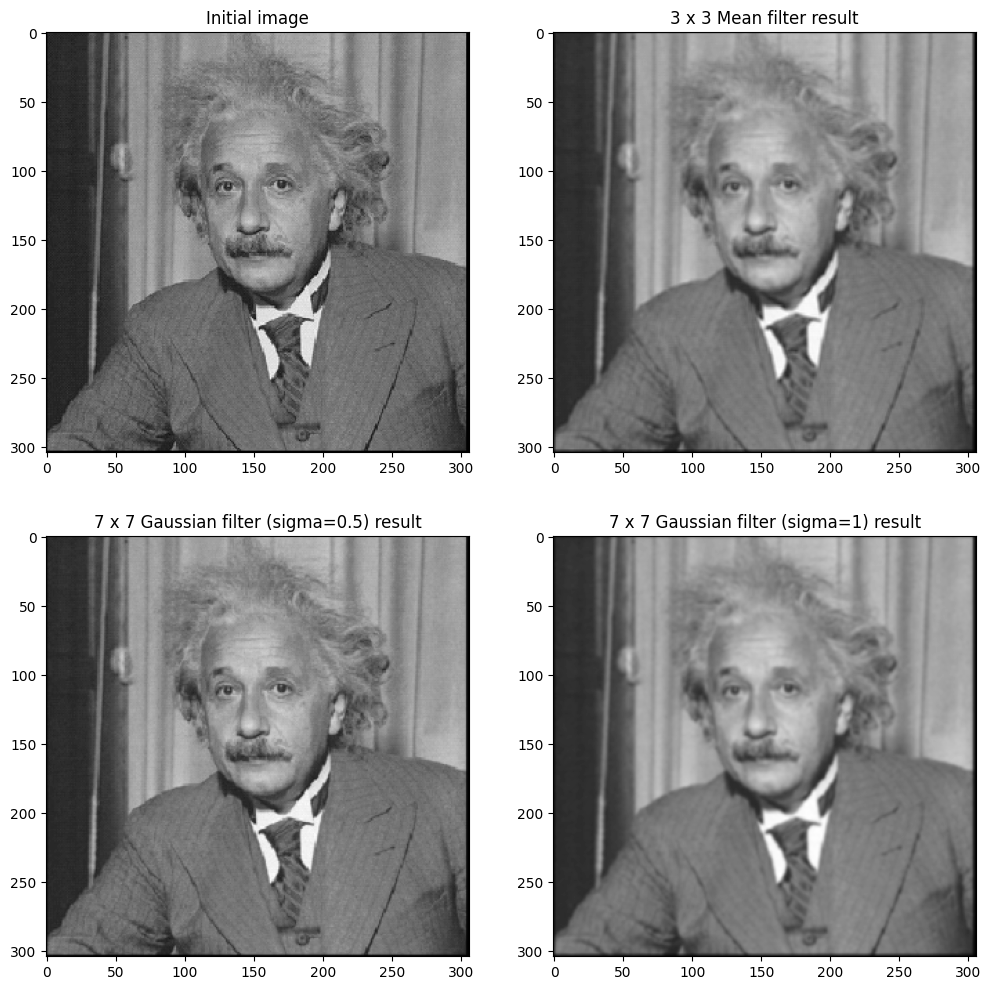

In [168]:

"""
Plot the results
"""
fig = plt.figure(figsize=(12, 12))
ax1 = plt.subplot(2, 2, 1)
ax1.title.set_text("Initial image")
plt.imshow(img_gray, "gray")
ax2 = plt.subplot(2, 2, 2)
ax2.title.set_text("3 x 3 Mean filter result")
plt.imshow(img_mean_blur, "gray")
ax3 = plt.subplot(2, 2, 3)
ax3.title.set_text("7 x 7 Gaussian filter (sigma=0.5) result")
plt.imshow(img_gaussian_1, "gray")
ax4 = plt.subplot(2, 2, 4)
ax4.title.set_text("7 x 7 Gaussian filter (sigma=1) result")
plt.imshow(img_gaussian_2, "gray")
plt.show()




Discussion：
结果是修改sigma变大后，可以很直观的感觉图像变得模糊。 
修改filter sizes 大小变化没有变化。测试了以下值
G1 = get_gaussian_kernel(107, 107, 0.5)
G2 = get_gaussian_kernel(7, 7, 0.5)

为什么滤波器大小变化没有明显效果？
标准差（sigma）对高斯滤波器的影响：

高斯滤波器的主要作用由标准差决定。标准差控制了滤波器的扩散范围（高斯曲线的宽度），即像素邻域的影响范围。
如果滤波器大小比高斯函数的影响范围大得多，滤波器远端的权重接近零（几乎没有贡献）。因此，增加滤波器大小不会显著影响结果。
滤波器大小与图像特征尺度：

如果滤波器的核心有效区域（受高斯权重影响的区域）在较小的尺寸（例如7×7）内已经包含主要信息，则增加滤波器大小不会显著改变结果。
换句话说，大尺寸滤波器在远离中心的区域可能会有极低的权重，几乎不起作用。

在卷积操作中，滤波器在图像边界区域的处理需要特殊考虑，因为滤波器的中心可能超出图像边界。padding_type 是一种控制边界处理方式的参数，常见的类型包括：

zero（零填充）：

用零填充图像的边界。
滤波器在图像边缘会包含一些零像素，可能导致边缘区域变暗。
replicate（复制边缘）：

用图像边缘的像素值填充。
滤波器在边缘区域的行为与中心区域更一致，避免因零填充导致的边缘效应。

## Task 5: Edge Detection with Sobel Filter
The Sobel filter is commonly used to detect edges in images by calculating the gradient of the image intensity. It emphasizes areas of high spatial frequency that correspond to edges. Here, we will apply the Sobel filter to detect edges in the grayscale image of Albert Einstein.

We start by applying separate Sobel filters in both the x and y directions, which will highlight horizontal and vertical edges, respectively. The combined result will provide a comprehensive edge map of the entire image.



### Tasks:
* Use your own kenel and extract edge on x and y with sobel filter with only numpy.
* Using the package - *time* does your algorithm compare to the built-in median filtering of opencv? Also, measure the time difference and compare result from your implementation and opencv

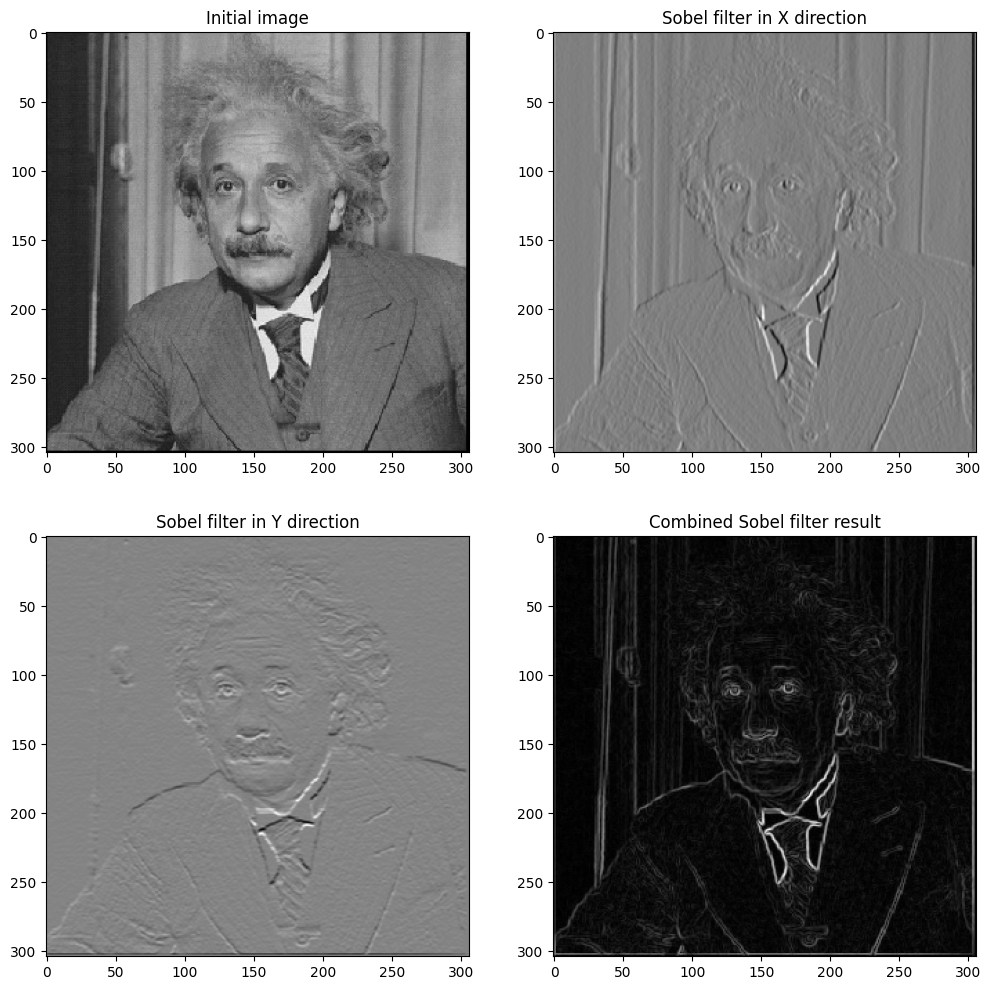

In [181]:
img = cv2.imread("../dataset/einstein.png")
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32)
sobel_x = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=3)  # Sobel filter in x direction
sobel_y = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=3)  # Sobel filter in y direction
sobel_combined = cv2.magnitude(sobel_x, sobel_y)  # Combine the gradients
fig = plt.figure(figsize=(12, 12))
ax1 = plt.subplot(2, 2, 1)
ax1.title.set_text("Initial image")
plt.imshow(img_gray, "gray")
ax2 = plt.subplot(2, 2, 2)
ax2.title.set_text("Sobel filter in X direction")
plt.imshow(sobel_x, "gray")
ax3 = plt.subplot(2, 2, 3)
ax3.title.set_text("Sobel filter in Y direction")
plt.imshow(sobel_y, "gray")
ax4 = plt.subplot(2, 2, 4)
ax4.title.set_text("Combined Sobel filter result")
plt.imshow(sobel_combined, "gray")
plt.show()


Custom Sobel filter time: 1.364496 seconds
OpenCV Sobel filter time: 0.050935 seconds


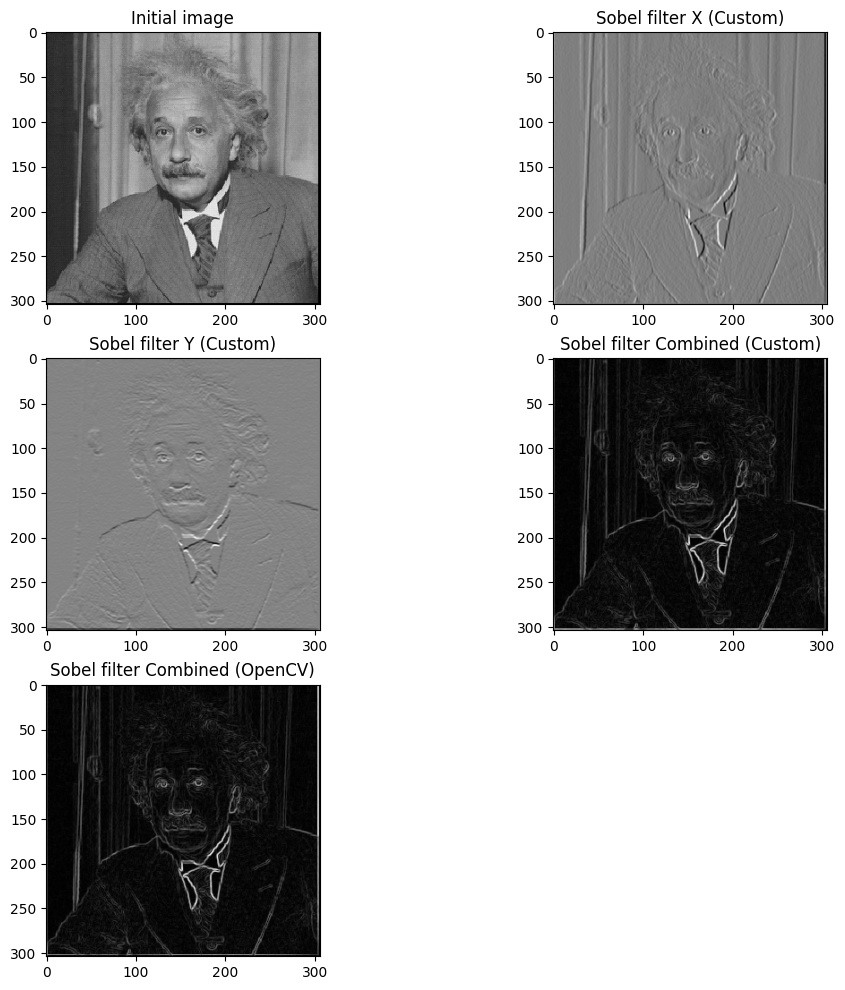

In [183]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import time

def apply_sobel_filter(src_img, direction):
    """
    Apply Sobel filter in the specified direction.
    :param src_img: gray scaled source image with size HxW
    :param direction: 'x' for x-direction, 'y' for y-direction
    :return: edge-detected image
    """
    assert direction in ['x', 'y'], "Direction must be 'x' or 'y'."

    if direction == 'x':
        kernel = np.array([[-1, 0, 1],
                           [-2, 0, 2],
                           [-1, 0, 1]], dtype=np.float32)
    else:  # direction == 'y'
        kernel = np.array([[-1, -2, -1],
                           [0, 0, 0],
                           [1, 2, 1]], dtype=np.float32)

    H, W = src_img.shape
    kH, kW = kernel.shape
    pad_h, pad_w = kH // 2, kW // 2

    # Apply zero padding to the image
    padded_img = np.pad(src_img, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant', constant_values=0)

    # Convolution operation
    sobel_filtered = np.zeros_like(src_img, dtype=np.float32)
    for i in range(H):
        for j in range(W):
            region = padded_img[i:i + kH, j:j + kW]
            sobel_filtered[i, j] = np.sum(region * kernel)

    return sobel_filtered

# Example placeholder for testing
def test_sobel_filter(img_path):
    """
    Test Sobel filter implementation with the specified image path.
    """
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise FileNotFoundError("Image not found. Please provide a valid file path.")
    img_gray = img.astype(np.float32)

    # Apply Sobel filter in both directions (custom implementation)
    start_time_custom = time.time()
    sobel_x_custom = apply_sobel_filter(img_gray, 'x')
    sobel_y_custom = apply_sobel_filter(img_gray, 'y')
    sobel_combined_custom = np.sqrt(sobel_x_custom ** 2 + sobel_y_custom ** 2)
    end_time_custom = time.time()

    # Apply Sobel filter using OpenCV
    start_time_opencv = time.time()
    sobel_x_opencv = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y_opencv = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=3)
    sobel_combined_opencv = cv2.magnitude(sobel_x_opencv, sobel_y_opencv)
    end_time_opencv = time.time()

    # Measure and compare times
    custom_time = end_time_custom - start_time_custom
    opencv_time = end_time_opencv - start_time_opencv

    print(f"Custom Sobel filter time: {custom_time:.6f} seconds")
    print(f"OpenCV Sobel filter time: {opencv_time:.6f} seconds")

    # Visualize the results
    fig = plt.figure(figsize=(12, 12))
    ax1 = plt.subplot(3, 2, 1)
    ax1.title.set_text("Initial image")
    plt.imshow(img_gray, cmap="gray")
    ax2 = plt.subplot(3, 2, 2)
    ax2.title.set_text("Sobel filter X (Custom)")
    plt.imshow(sobel_x_custom, cmap="gray")
    ax3 = plt.subplot(3, 2, 3)
    ax3.title.set_text("Sobel filter Y (Custom)")
    plt.imshow(sobel_y_custom, cmap="gray")
    ax4 = plt.subplot(3, 2, 4)
    ax4.title.set_text("Sobel filter Combined (Custom)")
    plt.imshow(sobel_combined_custom, cmap="gray")
    ax5 = plt.subplot(3, 2, 5)
    ax5.title.set_text("Sobel filter Combined (OpenCV)")
    plt.imshow(sobel_combined_opencv, cmap="gray")
    plt.show()

# Test function usage (replace 'your_image_path.png' with the actual path to your image)
test_sobel_filter("../dataset/einstein.png")


# Part 3: Corner Detection

In the second lecture of the week we went through about corner detection algorithms and how these can be used to find
interesting features on an image that can be used in applications such as stereo matching,
3D reconstruction, tracking, localization and recognition.
Our task here is to code two corner detection algorithms, the Moravec and the Harris
corner detector.

In [184]:
import numpy as np
import copy
import cv2
from matplotlib import pyplot as plt
import random
from PIL import Image
#to visualize the plots within the notebook
%matplotlib inline
# for making plots looking nicer
plt.style.use('fivethirtyeight')

## Task 6: Moravec corner detector  （UNmarked）

The Moravec corner detector uses a patch centred on each pixel as its own matching
template. The patch is shifted so that it is centred on each of the 8 neighbours of the pixel
and the sum of squared differences (SSD) is calculated between the original patch and the
shifted patch:

$$
    E = \sum_{\Delta \mathbf{x}} w(\Delta \mathbf{x})\big(I(\mathbf{x} + \Delta \mathbf{x}) - I(\mathbf{x}^{\prime} + \Delta \mathbf{x}\big)^2
$$


$w$ is a weighting function with the same dimension as the patch, you can use a Gaussian or constant weights. The corner metric (cornerness) is then taken to be the minimum of the SSD values calculated for each of the eight shifts of the window.
A pixel is marked as a corner if its cornerness is above a user-specified threshold.


Your task is to write your implementation of the Moravec corner detector.
It will take as input a grayscale image, the window size, the threshold and optionally a Gaussian function for $w$. It will give as output a corner map as a list of pixel coordinates where a corner is detected.


In [17]:
def draw_corners(image, corners_map, color=(255, 0, 0)):
    """Draw a point for each possible corner.
    color image: [H, W, 3]
    corners_map: list of pixel coordinates (xy indexing)
    """
    
    color_img = cv2.cvtColor(image[:,:,0], cv2.COLOR_GRAY2BGR)
    for corner in corners_map:
        cv2.circle(color_img, corner, 1, color, -1)
    return color_img

def make_mean_filter_kernel(h, w):
    return np.ones((h, w)) / (h * w)

def make_gaussian_kernel(h, w, sigma):
    assert (h % 2 == 1) and (w % 2 == 1), print("kernal size must be odd number!")
    
    x = np.arange(-(h // 2), h // 2 + 1, 1.)
    y = np.arange(-(w // 2), w // 2 + 1, 1.)
    xx, yy = np.meshgrid(x, y)
    two_sigma_2 = 2 * sigma ** 2
    G = np.exp(-(xx ** 2 + yy ** 2) / two_sigma_2) / (two_sigma_2 * np.pi)
    G /= G.sum()
    return G

def SSD(patch1, patch2, weight):
    return (weight * (patch1 - patch2) ** 2).sum()

def moravec(image, window_size=3, threshold=100., weights=None):
    """Moravec's corner detection for each pixel of the image.
    image: grayscale image: [H, W]
    """
    assert window_size % 2 == 1, "window size should be an odd number"
    
    neighbours = [(-1, 0), (1, 0), (0, -1), (0, 1), (-1, -1), (-1, 1), (1, -1), (1, 1)]
    if weights is None:
        weights = make_mean_filter_kernel(window_size, window_size)
    
    corners = []
    k = window_size // 2
    H, W = image.shape[0], image.shape[1]
    for i in range(0, H):
        for j in range(0, W):
            if i-k < 0 or j-k < 0 or i+k >= H or j+k >= W:
                continue
            centre_patch = image[i-k:i+k+1, j-k:j+k+1]
            E = []
            for nei in neighbours:
                di, dj = nei
                ii, jj = i + di, j + dj
                if ii-k < 0 or jj-k < 0 or ii+k >= H or jj+k >= W:
                    continue
                patch = image[ii-k:ii+k+1, jj-k:jj+k+1]
                E.append(SSD(centre_patch, patch, weights))
            minE = np.array(E).min()
            if minE > threshold:
                corners.append((j, i))

    return corners

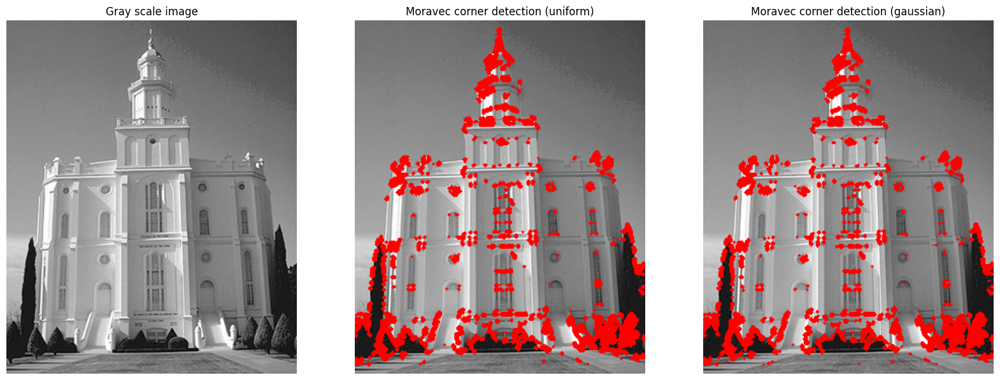

In [ ]:
img = cv2.imread('../dataset/building.png')
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32)

moravec_corners = moravec(gray_img, threshold=200.)
img_with_corner = draw_corners(img, moravec_corners)

moravec_corners2 = moravec(gray_img, threshold=200., weights=make_gaussian_kernel(3, 3, 1.0))
img_with_corner2 = draw_corners(img, moravec_corners2)

# Show Original and detected corners on image
fig, axis = plt.subplots(1, 3, figsize=(20, 8), sharey=False)
axis[0].imshow(gray_img, 'gray')
axis[0].grid(False)
axis[0].set_title('Gray scale image')
axis[0].set_axis_off()

axis[1].imshow(img_with_corner, 'gray')
axis[1].grid(False)
axis[1].set_title('Moravec corner detection (uniform)')
axis[1].set_axis_off()

axis[2].imshow(img_with_corner2, 'gray')
axis[2].grid(False)
axis[2].set_title('Moravec corner detection (gaussian)')
axis[2].set_axis_off()

plt.show()

## Task 7: Harris corner detector

The Harris corner detector builds upon the concepts of the Moravec corner detector, but
overcomes its limitations by generalising the measure of cornerness.
The basic limitation of the Moravec detector is that it only calculates cornerness for the 8 main directions
corresponding to the neighbours of a pixel, which means it will not detect a corner in any other direction.
The Harris detector uses the image structure tensor to overcome this. The image structure tensor is:

$$
    S = 
    \begin{pmatrix}
     I^2_x   & I_x I_y\\
     I_x I_y & I^2_y
    \end{pmatrix}
$$

where $I_x$ is the partial derivative of the image in the x direction and $I_y$ is the partial derivative of the image in the y direction.
The structure tensor summarizes the main directions of the gradient of the image for every pixel and therefore its two eigenvalues can be used to determine whether there is a corner at a pixel (if both eigenvalues are large).
The cornerness response metric is then defined as follows:

$$
    C = \text{det}(S) - k \text{tr}(S)^2 \\
$$

where $k$ is a an empirically determined hyper-parameter, usually in the range of $[0.04, 0.06]$

### Non-maximum Suppression (NMS)

In most cases, naivly thresholding the response map will lead to a lot of false-positives, i.e. blobs around real corners. One way to mitigate this to use Non-maximum Suppression (NMS). There is a number of ways of doing it, but the principle is to only keep the pixel with maxium response for aby local regions. You can try by simply setting pixels that have an 8 neighbour with higher cornerness to zero.

In [ ]:
"""
Utility functions here, you can use code from the last week. FFT implementation is reccomended as it is faster.
"""
def apply_filter(src_img, kernel):
    pass


def apply_gaussian_filter(src_img, k=5, sigma=1.0):
    pass


def gradientX(image):
    kernel = np.array([[-1., 0., 1.],
                       [-2., 0., 2.],
                       [-1., 0., 1.]]) / 9.
    filtered_image = apply_filter(image, kernel)
    return filtered_image

def gradientY(image):
    kernel = np.array([[-1., -2., -1.],
                       [0., 0., 0.],
                       [1., 2., 1.]]) / 9.
    filtered_image = apply_filter(image, kernel)
    return filtered_image


def nms(response, threshold, window_size=3):
    pass

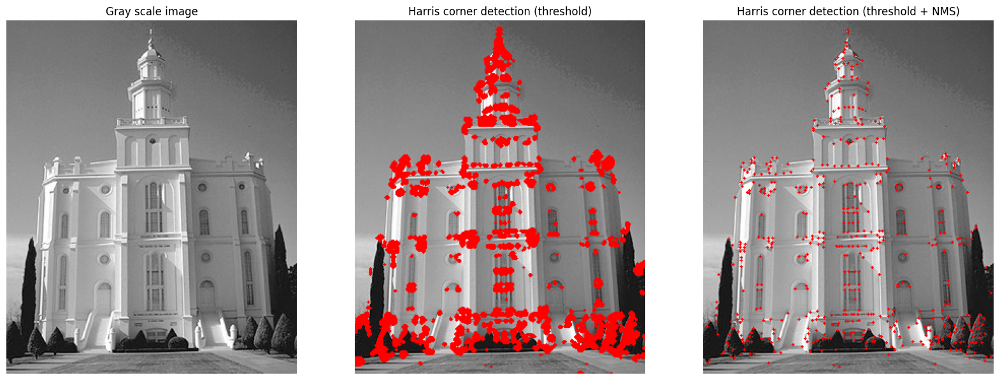

In [ ]:
img = cv2.imread('../dataset/building.png')
k = 0.05
threshold = 2000.
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32)
H, W = gray_img.shape
# Write your code here:

corners =
harris_img_corner = draw_corners(img, corners)
# corners after NMS
corners_nms =
harris_img_corner_nms = draw_corners(img, corners_nms)

# Show Original and detected corners on image
fig, axis = plt.subplots(1, 3, figsize=(20, 8), sharey=False)
axis[0].imshow(gray_img, 'gray')
axis[0].grid(False)
axis[0].set_title('Gray scale image')
axis[0].set_axis_off()

axis[1].imshow(harris_img_corner, 'gray')
axis[1].grid(False)
axis[1].set_title('Harris corner detection (threshold)')
axis[1].set_axis_off()

axis[2].imshow(harris_img_corner_nms, 'gray')
axis[2].grid(False)
axis[2].set_title('Harris corner detection (threshold + NMS)')
axis[2].set_axis_off()

plt.show()

# Part 4 Feature extraction and Matching


## Task 8 SIFT Feature Detection and Matching

#### Step 1: SIFT Feature Detection and Visualization
Here we demonstrates how SIFT detects features in a single image:
- Loads and preprocesses the image
- Detects SIFT keypoints
- Visualizes the keypoints on the image
- Shows keypoint orientations and scales

#### Step 2: Feature Matching Between Images
Here we show how SIFT features are matched between two images:
- Detects features in both images
- Matches features using ratio test
- Visualizes the matching results with lines connecting matched points
- Shows match distance distribution

### Tasks:

1. With the example provided:
   1.  Vary the paratmeter on  'max_image_size', 'max_features', 'ratio_thresh' to see their impact on perforamnce, such as matching reuslt and time consumption.

2. Capture your own image pair with:
   1. Slight variation of angle and match them
   2. Big variation of angle and match them
   3. Different time of the day or lighting variation and match them
   4. With one image using your phone or laptop webcam and match them

3. Compare Harris detector result with SIFT and FAST (https://docs.opencv.org/3.4/df/d0c/tutorial_py_fast.html)


In [ ]:
import cv2
import time
import numpy as np
import matplotlib.pyplot as plt

#### Common Functions

In [ ]:
# Common Functions
def load_image(image_path, max_size):
    """Load and resize image if too large"""
    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError(f"Could not load image: {image_path}")
    
    # Resize if image is too large
    h, w = img.shape[:2]
    if max(h, w) > max_size:
        scale = max_size / max(h, w)
        new_size = (int(w * scale), int(h * scale))
        img = cv2.resize(img, new_size, interpolation=cv2.INTER_AREA)
    
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    return img_gray, img_rgb

def visualize_features(img_rgb, keypoints, title="SIFT Features"):
    """Visualize SIFT features with circles and orientations"""
    img_with_kp = img_rgb.copy()
    
    for kp in keypoints:
        x, y = int(kp.pt[0]), int(kp.pt[1])
        size = int(kp.size)
        angle = kp.angle * np.pi / 180.0
        
        cv2.circle(img_with_kp, (x, y), size, (0, 255, 0), 1)
        end_x = int(x + size * np.cos(angle))
        end_y = int(y + size * np.sin(angle))
        cv2.line(img_with_kp, (x, y), (end_x, end_y), (0, 255, 0), 1)
    
    plt.figure(figsize=(12, 8))
    plt.imshow(img_with_kp)
    plt.title(f"{title}\n{len(keypoints)} keypoints detected")
    plt.axis('off')
    plt.tight_layout()

    
def visualize_matches(img1_rgb, img2_rgb, keypoints1, keypoints2, good_matches, 
                     distances, max_display_matches):
    """Visualize feature matches between images"""
    good_matches = sorted(good_matches, key=lambda x: x.distance)[:max_display_matches]
    
    plt.figure(figsize=(12, 6))
    
    # Plot histogram
    plt.subplot(1, 2, 1)
    plt.hist(distances, bins=30, color='blue', alpha=0.7)
    plt.title(f"Match Distances\n({len(good_matches)} shown of {len(distances)} matches)")
    plt.xlabel("Distance")
    plt.ylabel("Count")
    
    # Draw matches
    match_img = cv2.drawMatches(
        img1_rgb, keypoints1,
        img2_rgb, keypoints2,
        good_matches, None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS,
        matchColor=(0, 255, 0)
    )
    
    plt.subplot(1, 2, 2)
    plt.imshow(match_img)
    plt.title("SIFT Matches")
    plt.axis('off')
    plt.tight_layout()


In [ ]:
def detect_features(img, max_features):
    """Detect SIFT features"""
    sift = cv2.SIFT_create(nfeatures=max_features)
    keypoints, descriptors = sift.detectAndCompute(img, None)
    return keypoints, descriptors


In [ ]:
def match_features(descriptors1, descriptors2, ratio_thresh):
    """Match features using BFMatcher with ratio test"""
    bf = cv2.BFMatcher(cv2.NORM_L2)
    matches = bf.knnMatch(descriptors1, descriptors2, k=2)
    
    good_matches = []
    distances = []
    for m, n in matches:
        if m.distance < ratio_thresh * n.distance:
            good_matches.append(m)
            distances.append(m.distance)
    
    return good_matches, distances

#### Extract Feature Points


=== Stage 1: Single Image SIFT Detection ===
Image size: (554, 800, 3)
Processing time: 0.232 seconds
Features detected: 1000


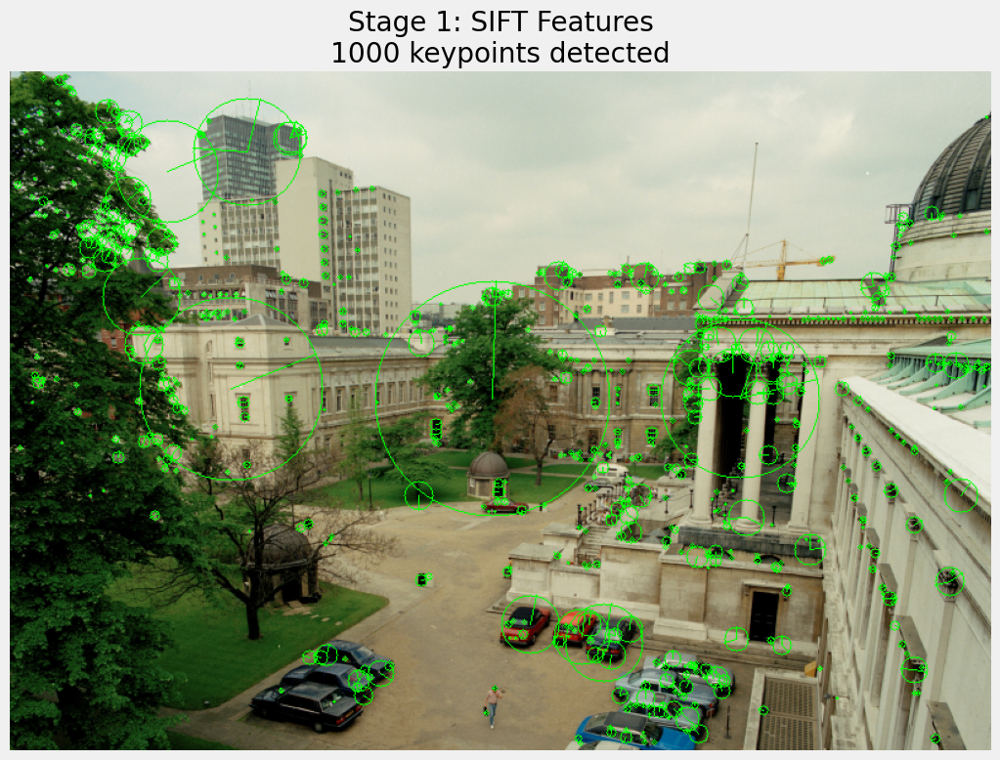

In [ ]:
# Parameters for Stage 1
params = {
    'max_image_size': 800,
    'max_features': 1000,
}

# Image path
img_path = '../dataset/UCL_21May91.jpg'

print("\n=== Stage 1: Single Image SIFT Detection ===")

# Load and process image
t0 = time.time()
img_gray, img_rgb = load_image(img_path, params['max_image_size'])
print(f"Image size: {img_rgb.shape}")

# Detect features
keypoints, descriptors = detect_features(img_gray, params['max_features'])
t1 = time.time()

print(f"Processing time: {t1-t0:.3f} seconds")
print(f"Features detected: {len(keypoints)}")

# Visualize
visualize_features(img_rgb, keypoints, "Stage 1: SIFT Features")
plt.show()

#### Match feature Points 


=== Stage 2: Feature Matching ===
Image 1 features: 1000
Image 2 features: 1001
Processing time: 0.543 seconds
Matches found: 104 good matches


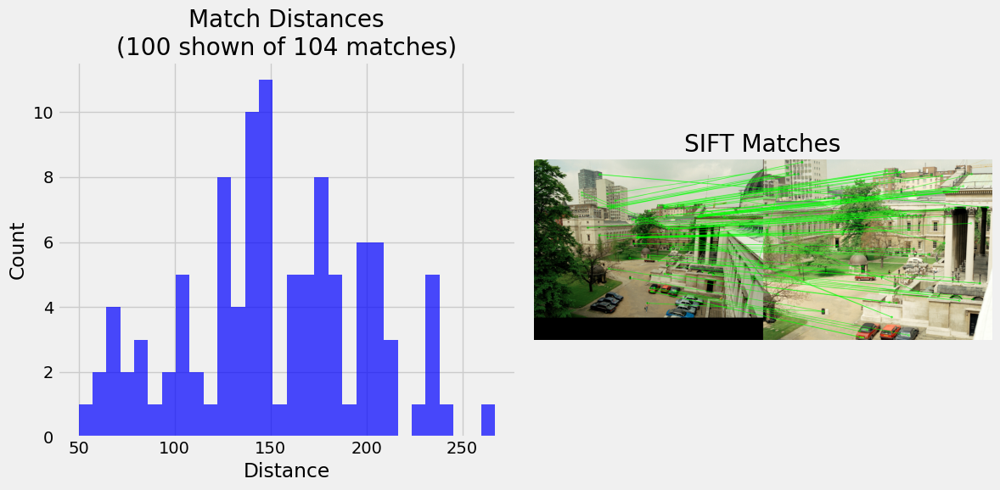

In [ ]:
# Parameters for Stage 2
params = {
    'max_image_size': 800,
    'max_features': 1000,
    'ratio_thresh': 0.75,
    'max_display_matches': 100
}
# Image paths
img1_path = '../dataset/UCL_21May91.jpg'
img2_path = '../dataset/UCLQuad_21May91.jpg'

print("\n=== Stage 2: Feature Matching ===")

# Load and process first image
t0 = time.time()
img1_gray, img1_rgb = load_image(img1_path, params['max_image_size'])
keypoints1, descriptors1 = detect_features(img1_gray, params['max_features'])
print(f"Image 1 features: {len(keypoints1)}")

# Load and process second image
img2_gray, img2_rgb = load_image(img2_path, params['max_image_size'])
keypoints2, descriptors2 = detect_features(img2_gray, params['max_features'])
print(f"Image 2 features: {len(keypoints2)}")

# Match features
good_matches, distances = match_features(descriptors1, descriptors2, 
                                       params['ratio_thresh'])
t1 = time.time()

print(f"Processing time: {t1-t0:.3f} seconds")
print(f"Matches found: {len(good_matches)} good matches")

# Visualize matches
visualize_matches(img1_rgb, img2_rgb, keypoints1, keypoints2, 
                good_matches, distances, params['max_display_matches'])
plt.show()